# JUPITER NOTEBOOK: FULL DATASET

## Sritama Dutta

# Table of contents

* [Find services involved with a given list of target_names](#Find-the-names-of-services-involved-with-target-names-of-our-choice)
* [Find services involved with a given list of target_classes](#Find-the-names-of-services-involved-with-target-classes-of-our-choice)
* [Serialization of data of some columns](#Serialization-of-data-for-some-columns-of-entire-dataset)
* [Find services related to a given target_name](#Finding-the-names-of-services-associated-with-a-given-target-name)
* [Deserialization of cleaned target class into separate rows](#Deserialization-of-target-class-into-separate-rows)
* [Cleaning and pre-processing target_class before Word Cloud](#Cleaning-and-pre-processing-target-class-before-Word-Cloud)
* [WordCloud for target class of entire dataset](#WordCloud-for-target-class-of-entire-dataset-after-cleaning)
* [Deserialization of target_names into separate rows](#Deserialization-of-target-names-into-separate-rows)
* [Cleaning and pre-processing target_name before Word Cloud](#Cleaning-and-pre-processing-target-name-before-Word-Cloud)
* [WordCloud for cleaned target_name for entire dataset](#WordCloud-for-Cleaned-target-name-column-of-entire-dataset)


# Find the names of services involved with target names of our choice

From the entire dataset we wish to know which are those services which are concerned with the target_names of our interest.

Suppose we have been given a list of target_names like sun, mars, jupiter , moon,titan,mercury,venus and saturn. 
We want to find all the services in the entire dataset which are involved with the above target names.

In [28]:
import json
with open('virtualRegistry.json') as fp:      # open the virtualRegistry json file
    registry_list = json.load(fp)             # load the json file

import pandas
services = pandas.read_json(json.dumps(registry_list['services']), orient='record')      # opening the json file as pandas
services

,accessurl,contributors,creator,description,identifier,logo,publisher,referenceurl,schema,shortname,title
0,http://voparis-tap-helio.obspm.fr/__system__/t...,"[Xavier Bonnin, Christian ReniÃ©, PADC]",[Jean Aboudarham],Solar active regions extracted from Heliophysi...,ivo://vopdc.obspm/lesia/hfc1ar/epn,http://voparis-srv-paris.obspm.fr/logos/PADC_s...,Paris Astronomical Data Centre - LESIA,http://voparis-helio.obspm.fr/hfc-gui/,hfc1ar,HFC1AR,Heliophysics Feature Catalog active regions
1,http://voparis-tap-planeto.obspm.fr/__system__...,[PADC],[Jean Schneider],VO-compliant and interactive encyclopaedia of ...,ivo://vopdc.obspm/luth/exoplanet/epn,http://voparis-srv-paris.obspm.fr/logos/PADC_s...,Paris Astronomical Data Centre - LUTH,http://exoplanet.eu/,exoplanet,ExoPlanet,Extrasolar Planets Encyclopaedia
2,http://voparis-tap-planeto.obspm.fr/__system__...,[PADC],[StÃ©phane Erard],This service provides the most accurate values...,ivo://vopdc.obspm/lesia/planets/epn,http://voparis-srv-paris.obspm.fr/logos/PADC_s...,Paris Astronomical Data Centre - LESIA,http://lesia.obspm.fr,planets,planets,Main characteristics of solar system planets
3,http://voparis-tap-planeto.obspm.fr/__system__...,[PADC],[StÃ©phane Erard],This service is a redesigned version of the PD...,ivo://vopdc.obspm/lesia/pds_speclib/epn,http://voparis-srv-paris.obspm.fr/logos/PADC_s...,Paris Astronomical Data Centre - LESIA,https://perso.lesia.obspm.fr/data-services/pds...,pds_speclib,pds_speclib,PDS spectral library
4,http://voparis-tap-planeto.obspm.fr/__system__...,[PADC],[StÃ©phane Erard],This service provides a compilation of global ...,ivo://vopdc.obspm/lesia/spectro_planets/epn,http://voparis-srv-paris.obspm.fr/logos/PADC_s...,Paris Astronomical Data Centre - LESIA,https://perso.lesia.obspm.fr/data-services/pla...,spectro_planets,spectro_planets,Spectra of planets and satellites
5,http://voparis-tap-planeto.obspm.fr/__system__...,"[M. Popescu, Jonathan Normand, PADC]",[Mirel Birlan],Compiled database for asteroid spectra in the ...,ivo://vopdc.obspm/imcce/m4ast,http://voparis-srv-paris.obspm.fr/logos/PADC_s...,Paris Astronomical Data Centre - IMCCE,http://cardamine.imcce.fr/m4ast,m4ast,M4AST,M4AST - Modeling for Asteroids
6,http://voparis-tap-helio.obspm.fr/__system__/t...,"[Xavier Bonnin, Christian ReniÃ©, PADC]",[Jean Aboudarham],Solar type 3 bursts extracted from Heliophysic...,ivo://vopdc.obspm/lesia/hfc1t3/epn,http://voparis-srv-paris.obspm.fr/logos/PADC_s...,Paris Astronomical Data Centre - LESIA,http://voparis-helio.obspm.fr/hfc-gui/,hfc1t3,HFC1T3,Heliophysics Feature Catalog type 3 radio bursts
7,http://voparis-tap-planeto.obspm.fr/__system__...,"[StÃ©phane Erard, IKI, PDS, PADC]",[LESIA],Measurements of comet Halley in the spectral c...,ivo://vopdc.obspm/lesia/iks/epn,http://voparis-srv-paris.obspm.fr/logos/PADC_s...,Paris Astronomical Data Centre - LESIA,http://lesia.obspm.fr/IKS/,iks,IKS,IR spectroscopy of comet Halley
8,http://voparis-tap-planeto.obspm.fr/__system__...,[PADC],[Sandrine Vinatier],This database displays vertical profiles of te...,ivo://vopdc.obspm/lesia/titan/epn,NaN,Paris Astronomical Data Centre - LESIA,http://www.lesia.obspm.fr,titan,Titan,Vertical Profiles in Titan Middle Atmosphere
9,http://voparis-tap-planeto.obspm.fr/__system__...,[PADC],[Florence Henry],The database of planetary images (BDIP) comes ...,ivo://vopdc.obspm/lesia/bdip/epn,NaN,Paris Astronomical Data Centre - LESIA,http://lesia.obspm.fr/BDIP/,bdip,BDIP,Base de DonnÃ©es d'Images PlanÃ©taires


In [29]:
# Cell 2
import sys
import os
import sty
for service in services['schema']:     #for every service name present in column named schema of above dataframe named services
    sdir=os.path.join('data',service)   # join the paths
    if not os.path.isdir(sdir):         # if isdir() returns false, then print service name and  not found, highlight=red
        print('\n'+sty.bg.red + "Service '{!s}' not found".format(service) + sty.bg.rs + '\n')
        continue
    print(sty.fg.blue + '{!s}/'.format(service) + sty.fg.rs) # if isdir() returns True, print the service name
    for f in os.listdir(sdir):
        print('\t{!s}'.format(f))

hfc1ar/
	hfc1ar_1000.json
	hfc1ar_latest.json
exoplanet/
	exoplanet_1000.json
	exoplanet_latest.json
planets/
	planets_8.json
	planets_latest.json
pds_speclib/
	pds_speclib_1000.json
	pds_speclib_latest.json
spectro_planets/
	spectro_planets_136.json
	spectro_planets_latest.json
m4ast/
	m4ast_1000.json
	m4ast_latest.json
hfc1t3/
	hfc1t3_1000.json
	hfc1t3_latest.json
iks/
	iks_206.json
	iks_latest.json
titan/
	titan_1000.json
	titan_latest.json
bdip/
	bdip_1000.json
	bdip_latest.json
nda/
	nda_1000.json
	nda_latest.json
ndcs/
	ndcs_1000.json
	ndcs_latest.json
amdadb/
	amdadb_1000.json
	amdadb_latest.json
basecom/
	basecom_1000.json
	basecom_latest.json
apis/
	apis_1000.json
	apis_latest.json
iitatehf/
	iitatehf_1000.json
	iitatehf_latest.json
iprt/
	iprt_1000.json
	iprt_latest.json
hisaki/
	hisaki_1000.json
	hisaki_latest.json
impex_epn20/
	impex_epn20_1000.json
	impex_epn20_latest.json
vexmag_epn20/
	vexmag_epn20_1000.json
	vexmag_epn20_latest.json
crism/
	crism_1000.json
	crism_latest

In [30]:
# Cell 3
from glob import glob

file1=list()
def resolve_link(link_filename1):         
    with open(link_filename1,'r') as fp:    # open the json file in read mode as fp
        link_content1 = fp.readlines()[0]   # read the lines till the EOF and consider the 0th element in the list
    _dir1 = os.path.dirname(link_filename1)  # Return the directory name of the link_filename
    actual_filename1 = os.path.join(_dir1, link_content1) # join the paths (_dir and link_content)
    #print(actual_filename)
    return actual_filename1

for service in services['schema']:
    sdir1=os.path.join('data',service)   # join the paths
    # for each epn_core service/schema in the registry file..
    if not os.path.isdir(sdir1):         # if isdir() returns false, continue 
        continue
    f1 = os.path.join(sdir1,"{}_latest.json".format(service)) # join the paths/
    # Let's read the retrieved data in the json file..
    print("Reading file: {}".format(f1))
    f1 = resolve_link(f1)     # call to resolve_link(), it will return the actual_filename for 'f'
    f1=f1.split('\\')
    f1='/'.join(f1)
    print(f1)
    file1.append(f1)

Reading file: data\hfc1ar\hfc1ar_latest.json
data/hfc1ar/hfc1ar_1000.json
Reading file: data\exoplanet\exoplanet_latest.json
data/exoplanet/exoplanet_1000.json
Reading file: data\planets\planets_latest.json
data/planets/planets_8.json
Reading file: data\pds_speclib\pds_speclib_latest.json
data/pds_speclib/pds_speclib_1000.json
Reading file: data\spectro_planets\spectro_planets_latest.json
data/spectro_planets/spectro_planets_136.json
Reading file: data\m4ast\m4ast_latest.json
data/m4ast/m4ast_1000.json
Reading file: data\hfc1t3\hfc1t3_latest.json
data/hfc1t3/hfc1t3_1000.json
Reading file: data\iks\iks_latest.json
data/iks/iks_206.json
Reading file: data\titan\titan_latest.json
data/titan/titan_1000.json
Reading file: data\bdip\bdip_latest.json
data/bdip/bdip_1000.json
Reading file: data\nda\nda_latest.json
data/nda/nda_1000.json
Reading file: data\ndcs\ndcs_latest.json
data/ndcs/ndcs_1000.json
Reading file: data\amdadb\amdadb_latest.json
data/amdadb/amdadb_1000.json
Reading file: data\

In [53]:
# Cell 4
file1

['data/hfc1ar/hfc1ar_1000.json',
 'data/exoplanet/exoplanet_1000.json',
 'data/planets/planets_8.json',
 'data/pds_speclib/pds_speclib_1000.json',
 'data/spectro_planets/spectro_planets_136.json',
 'data/m4ast/m4ast_1000.json',
 'data/hfc1t3/hfc1t3_1000.json',
 'data/iks/iks_206.json',
 'data/titan/titan_1000.json',
 'data/bdip/bdip_1000.json',
 'data/nda/nda_1000.json',
 'data/ndcs/ndcs_1000.json',
 'data/amdadb/amdadb_1000.json',
 'data/basecom/basecom_1000.json',
 'data/apis/apis_1000.json',
 'data/iitatehf/iitatehf_1000.json',
 'data/iprt/iprt_1000.json',
 'data/hisaki/hisaki_1000.json',
 'data/impex_epn20/impex_epn20_1000.json',
 'data/vexmag_epn20/vexmag_epn20_1000.json',
 'data/crism/crism_1000.json',
 'data/mars_craters/mars_craters_1000.json',
 'data/usgs_wms/usgs_wms_55.json',
 'data/m3/m3_584.json',
 'data/mcd/mcd_1000.json',
 'data/radiojove/radiojove_12.json',
 'data/vvex/vvex_1000.json',
 'data/spicam/spicam_1000.json',
 'data/tnosarecool/tnosarecool_592.json',
 'data/soi

In [16]:
df_service_target=pandas.DataFrame()  #df_service_target is a datframe that will contain target_name, name of service & score for target_name
for i in file1:
    with open(i) as fmc:
        df_tg = pandas.read_json(fmc, orient='record')
    #lets find score for 'target_name' by grouping all records by target_name and counting their nos and then divided by no of rows
    tg=(df_tg.groupby('target_name')['target_name'].count()/len(df_tg)).to_frame()
    tg=tg.rename(columns={'target_name':'score'})
    split1=i.split('/')
    tg['name']=split1[1]
    tg=tg.reset_index()
    #or i in range(0,len(tg['score'])):
     #  if tg['score'][i]==1:
      #     df_service_target=df_service_target.append(tg.
    df_service_target=df_service_target.append(tg.loc[tg.loc[:,'score']>0,:])

In [19]:
file1[0].split('/')  #to check how split1=i.split('/') works in above cell

['data', 'hfc1ar', 'hfc1ar_1000.json']

In [20]:
df_service_target=df_service_target.sort_values(['score'],ascending=[False] ) #we are sorting in desc order so that higher scores come on top
df_service_target   #this dataframe has 5674 rows × 3 columns

#score 1 means all the values of target_name for that service is that target_name

,target_name,score,name
0,sun,1.000000,hfc1ar
0,Moon,1.000000,m3
0,Jupiter,1.000000,bdip
0,Sun,1.000000,bass2000
0,Earth#Sun,1.000000,amdadb
0,Saturn,1.000000,apis
0,Jupiter,1.000000,iitatehf
0,Sun,1.000000,iprt
0,Mars,1.000000,impex_epn20
0,Venus,1.000000,vexmag_epn20


In [10]:
#we normalised the target_name by making each of them lower case and stripping leading and trailing whitespaces 
#tname_normalised is a new column of df_service_target which contains normalised target_name
df_service_target['tname_normalised'] = df_service_target.target_name.str.lower()
df_service_target['tname_normalised'] = df_service_target.tname_normalised.str.strip()
df_service_target

,target_name,score,name,tname_normalised
0,sun,1.000000,hfc1ar,sun
0,Venus,1.000000,vvex,venus
0,67P,1.000000,illu67p,67p
0,sun,1.000000,climso,sun
0,,1.000000,abs_cs,
0,Venus,1.000000,soir,venus
0,Sun,1.000000,hfc1t3,sun
0,1P,1.000000,iks,1p
0,Titan,1.000000,titan,titan
0,Jupiter,1.000000,nda,jupiter


In [13]:
# we create a pandas series named normal_tname where we have grouped the names of services by 'tname_normalised' column
normal_tname = df_service_target.groupby('tname_normalised')['name'].apply(lambda c:set(c))
normal_tname

tname_normalised
                   {m4ast, abs_cs, psa}
(1) ceres                         {mpc}
(10) hygiea                       {mpc}
(100) hekate                      {mpc}
(1000) piazzia                    {mpc}
(101) helena                      {mpc}
(102) miriam                      {mpc}
(103) hera                        {mpc}
(104) klymene                     {mpc}
(105) artemis                     {mpc}
(106) dione                       {mpc}
(107) camilla                     {mpc}
(108) hecuba                      {mpc}
(109) felicitas                   {mpc}
(11) parthenope                   {mpc}
(110) lydia                       {mpc}
(111) ate                         {mpc}
(112) iphigenia                   {mpc}
(113) amalthea                    {mpc}
(114) kassandra                   {mpc}
(115) thyra                       {mpc}
(116) sirona                      {mpc}
(117) lomia                       {mpc}
(118) peitho                      {mpc}
(119) althaea          

In [14]:
targets_of_interest = 'sun mars jupiter moon titan mercury venus saturn'
discarded_targets = []

In [28]:
#since we may not really see all the names of services properly so we have to change some options
pandas.options.display.max_colwidth = 1000

In [31]:
#we create a dataframe named df_tname_services whose index are those normalised target_names in our target_of_interest list
#name is a column of df_tname_services dataframe which gives us corresponding names of services
#tname_normalised is the index of df_tname_services
indx = normal_tname.index.isin(targets_of_interest.split()) #indx variable contains those normalised target_name in our list
df_tname_services=pandas.DataFrame(normal_tname[indx]) #df_tname_services is dataframe with target_name & corresponding services
df_tname_services

,name
tname_normalised,
jupiter,"{radiojove, iitatehf, nda, usgs_wms, lofar_jupiter, bdip, pvol, mdisc, transplanet, hisaki, hst_planeto, spectro_planets, planets}"
mars,"{spicam, mcd, usgs_wms, spectro_planets, pvol, transplanet, impex_epn20, hst_planeto, crism, mars_craters, planets}"
mercury,"{usgs_wms, pvol, spectro_planets, planets}"
moon,"{usgs_wms, m3, pvol, hst_planeto, spectro_planets}"
saturn,"{usgs_wms, apis, mdisc, pvol, hst_planeto, spectro_planets, planets}"
sun,"{iprt, bass2000, radiojove, hfc1t3, spectro_planets, climso, hfc1ar}"
titan,"{titan, hst_planeto, usgs_wms, spectro_planets}"
venus,"{soir, vvex, usgs_wms, pvol, transplanet, hst_planeto, spectro_planets, vexmag_epn20, planets}"


# Find the names of services involved with target classes of our choice

From the entire dataset we wish to know which are those services which are concerned with the target_classes of our interest.

Suppose we have been given a list of target_classes like asteroid, comet , planet, star, satellite, etc . 
We want to find all the services in the entire dataset which are involved with the above target classes.

In [40]:
df_service_targetclass=pandas.DataFrame()
for i in file1:     #file1 has already been created in the beginning of this notebook 
    with open(i) as fmc:
        df_tc = pandas.read_json(fmc, orient='record')
    #lets find score for 'target_class'
    tc=(df_tc.groupby('target_class')['target_class'].count()/len(df_tc)).to_frame()   #scoring target_class without cleaning
    tc=tc.rename(columns={'target_class':'score'})
    split2=i.split('/')
    tc['name']=split2[1]
    tc=tc.reset_index()
    #or i in range(0,len(tc['score'])):
     #  if tc['score'][i]==1:
      #     df_service_target=df_service_target.append(tg.
    df_service_targetclass=df_service_targetclass.append(tc.loc[tc.loc[:,'score']>0,:])

In [41]:
df_service_targetclass=df_service_targetclass.sort_values(['score'],ascending=[False] ) #we are sorting in desc order so that higher scores come on top   
df_service_targetclass

,target_class,score,name
0,star,1.000000,hfc1ar
0,planet,1.000000,impex_epn20
0,planet,1.000000,crism
0,exoplanet,1.000000,exoplanet
0,satellite,1.000000,m3
0,planet,1.000000,mcd
0,planet,1.000000,vvex
0,planet,1.000000,spicam
0,asteroid,1.000000,tnosarecool
0,planet,1.000000,soir


In [42]:
#cleaning and normalisation starts, we want to ensure all target_class candidates are in lower case & striped off whitespaces
#so we created another column in df_service_targetclass called class_normal
df_service_targetclass['target_class_normal'] = df_service_targetclass.target_class.str.lower()
df_service_targetclass['target_class_normal'] = df_service_targetclass.target_class_normal.str.strip()

df_service_targetclass

,target_class,score,name,target_class_normal
0,star,1.000000,hfc1ar,star
0,planet,1.000000,impex_epn20,planet
0,planet,1.000000,crism,planet
0,exoplanet,1.000000,exoplanet,exoplanet
0,satellite,1.000000,m3,satellite
0,planet,1.000000,mcd,planet
0,planet,1.000000,vvex,planet
0,planet,1.000000,spicam,planet
0,asteroid,1.000000,tnosarecool,asteroid
0,planet,1.000000,soir,planet


In [44]:
# now that we normalised target_class in the column class_normal
#we are grouping the names of services using target_class_normal column i.e. column with normalised target_classes
#normal_tclass is a pandas series 
normal_tclass = df_service_targetclass.groupby('target_class_normal')['name'].apply(lambda c:set(c))   
normal_tclass

target_class_normal
                                                                                                                                                                                                                                            {psa}
asteroid                                                                                                                                                                                            {tnosarecool, usgs_wms, mpc, m4ast, dynastvo}
comet                                                                                                                                                                                                        {iks, illu67p, hisaki, basecom, psa}
dwarf planet                                                                                                                                                                                                                        {hst_planeto}
dwarf_planet

In [45]:
#we are creating a target list of target_class that we think are important to us
target_classes_of_interest = 'planet asteroid star comet satellite'

In [47]:
ind = normal_tclass.index.isin(target_classes_of_interest.split())
df_tclass_services=pandas.DataFrame(normal_tclass[ind])
df_tclass_services
#grouping of services based on normalised target_class for those target_classes that we are interested in.

,name
target_class_normal,
asteroid,"{tnosarecool, usgs_wms, mpc, m4ast, dynastvo}"
comet,"{iks, illu67p, hisaki, basecom, psa}"
planet,"{lofar_jupiter, mdisc, pvol, soir, apis, impex_epn20, mars_craters, spectro_planets, vexmag_epn20, planets, vvex, usgs_wms, bdip, transplanet, hisaki, hst_planeto, crism, spicam, mcd, radiojove, iitatehf, nda}"
satellite,"{titan, usgs_wms, m3, pvol, hst_planeto, spectro_planets}"
star,"{iprt, bass2000, radiojove, hfc1t3, hisaki, spectro_planets, climso, hfc1ar}"


Thus we have accomplished grouping of services based on those target classes that we are interested in

# Serialization of data for some columns of entire dataset

In [50]:
#we have selected the following fields 
selected_fields = '''service_schema
                     target_name
                     target_class
                     s_region
                     obs_id
                     measurement_type
                     instrument_name
                     instrument_host_name
                     granule_uid
                     granule_gid
                     dataproduct_type'''.split()

In [51]:
#agg_df_keywords is a function that we have created for serialization
def agg_df_keywords(df):

    def sRegion_nonempty(series):    # passing a pandas series object
        non_empty_vals = sum(series.apply(lambda s:bool(len(s))))    # ?
#         empty_vals = sum(not series.str.strip().str.match(''))
#         res = None if empty_vals == len(series) else empty_vals
#         return str(res)
        return non_empty_vals
    
    def fields_unique(series):
        return ';'.join(set([s.strip().lower() for s in set(series.astype(str).tolist()) if s.strip()]))  # Serialization i.e. coding a list of unique values into a 1-line string and each value is separated by ; 

    df_summ = pandas.Series() # create a pandas Series object
    df_summ['target_name'] = fields_unique(df['target_name'])                    # copy the column 'target_name' to df_summ
    df_summ['target_class'] = fields_unique(df['target_class'])                  # copy the column 'target_class' to df_summ
    df_summ['measurement_type'] = fields_unique(df['measurement_type'])          # copy the column 'measurement_type' to df_summ
    df_summ['instrument_name'] = fields_unique(df['instrument_name'])            # copy the column 'instrumrnt_type' to df_summ 
    df_summ['instrument_host_name'] = fields_unique(df['instrument_host_name'])  # copy the column 'instrument_host_name' to df_summ
    df_summ['dataproduct_type'] = fields_unique(df['dataproduct_type'])          # copy the column 'dataproduct_type' to df_summ
    df_summ['s_region'] = sRegion_nonempty(df['s_region'])                       # copy the column 's_region' to df_summ
#     df_summ = df.agg({'target_name':fields_unique,
#                         'target_class':fields_unique,
#                         'measurement_type':fields_unique,
#                         'instrument_name':fields_unique,
#                         'instrument_host_name':fields_unique,
#                         'dataproduct_type':fields_unique})#,
#                         's_region':sRegion_nonempty})
#    schema = df['schema_epn_core'].unique()  # returns unique values from the column schema_epn_core
    schema = df['service_schema'].unique()  # returns unique values from the column schema_epn_core
    assert len(schema) == 1                  # we will get assertion error when len(schema) is not equal to 1 
    df_summ.name = schema[0]
    return df_summ

In [52]:
# Now we want to check what each service is providing on those fields.
# Fields supposedly providing a limited number of values we want to create the "set" of them:
# - target_name
# - target_class
# - measurement_type
# - instrument_name
# - instrument_host_name
# - dataproduct_type
# Fields which values can vary more or less freely we want to check if they can be empty:
# - s_region
# - obs_id
# - granule_uid
# - granule_gid

from IPython.display import display,HTML

df_agg = None

s_list = services['schema']#[0:3]
for s in s_list:
    sdir = os.path.join('data', s)
    if not os.path.isdir(sdir):     # if isdir() returns False print the statement and continue, 
                                 # (isdir(): Return True if path is an existing directory)
        print('\n' + sty.bg.red + '{!s}'.format(s) + sty.bg.rs + '\n')
        continue
        
    f = [f for f in glob(os.path.join(sdir,"{}_latest.json".format(s))) if '_0' not in f][0]  # list comprehension
                    # create a list where '_0' is not in f and store its 0th element
    print(sty.fg.blue + '{!s}'.format(s) + sty.fg.rs)
    f = resolve_link(f)
    with open(f,'r') as fp:  # open the file as f
        df = pandas.read_json(fp, orient='record') # df is a dataframe that reads the json files using pandas
    df = df[selected_fields]   # select only the selected_fields column
    
    display(HTML(df.head(10).to_html()))    #displaying in HTML only the first 10 rows from the top in df i.e. 10 rows of every service

    s_agg = agg_df_keywords(df)     #  using the fxn agg_df_keywords(), s_agg returns the non_empty values from df that are unique in serialised form using ;
    print(s_agg.to_frame())         # s_agg is printed in dataframe 
    
    if df_agg is not None:           
        df_agg = pandas.concat([df_agg,s_agg.to_frame()], axis=1, sort=False)  # concatenate df_agg and s_agg
    else:
        df_agg = s_agg.to_frame()

    print('\n')

hfc1ar


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,hfc1ar,sun,star,[],null,"phys.polarization.circular, phys.veloc.orbital;pos.heliocentric, spect.dopplerVeloc, spect.line.width, arith.rate;phys.mass.loss",MDI,SOHO,445542,ar,im
1,hfc1ar,sun,star,[],null,"phys.polarization.circular, phys.veloc.orbital;pos.heliocentric, spect.dopplerVeloc, spect.line.width, arith.rate;phys.mass.loss",MDI,SOHO,445543,ar,im
2,hfc1ar,sun,star,[],null,"phys.polarization.circular, phys.veloc.orbital;pos.heliocentric, spect.dopplerVeloc, spect.line.width, arith.rate;phys.mass.loss",MDI,SOHO,445544,ar,im
3,hfc1ar,sun,star,[],null,"phys.polarization.circular, phys.veloc.orbital;pos.heliocentric, spect.dopplerVeloc, spect.line.width, arith.rate;phys.mass.loss",MDI,SOHO,445545,ar,im
4,hfc1ar,sun,star,[],null,"phys.polarization.circular, phys.veloc.orbital;pos.heliocentric, spect.dopplerVeloc, spect.line.width, arith.rate;phys.mass.loss",MDI,SOHO,445546,ar,im
5,hfc1ar,sun,star,[],null,"phys.polarization.circular, phys.veloc.orbital;pos.heliocentric, spect.dopplerVeloc, spect.line.width, arith.rate;phys.mass.loss",MDI,SOHO,445547,ar,im
6,hfc1ar,sun,star,[],null,"phys.polarization.circular, phys.veloc.orbital;pos.heliocentric, spect.dopplerVeloc, spect.line.width, arith.rate;phys.mass.loss",MDI,SOHO,445548,ar,im
7,hfc1ar,sun,star,[],null,"phys.polarization.circular, phys.veloc.orbital;pos.heliocentric, spect.dopplerVeloc, spect.line.width, arith.rate;phys.mass.loss",MDI,SOHO,445549,ar,im
8,hfc1ar,sun,star,[],null,"phys.polarization.circular, phys.veloc.orbital;pos.heliocentric, spect.dopplerVeloc, spect.line.width, arith.rate;phys.mass.loss",MDI,SOHO,445550,ar,im
9,hfc1ar,sun,star,[],null,"phys.polarization.circular, phys.veloc.orbital;pos.heliocentric, spect.dopplerVeloc, spect.line.width, arith.rate;phys.mass.loss",MDI,SOHO,445551,ar,im


                                                                                                                                                hfc1ar
target_name                                                                                                                                        sun
target_class                                                                                                                                      star
measurement_type      phys.polarization.circular, phys.veloc.orbital;pos.heliocentric, spect.dopplerveloc, spect.line.width, arith.rate;phys.mass.loss
instrument_name                                                                                                                                    mdi
instrument_host_name                                                                                                                              soho
dataproduct_type                                                                              

,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,exoplanet,11 Com b,exoplanet,,882,phys.size;meta.file#phys.composition.species#phys.mass#phys.mass;stat.error#phys.size.radius#phys.size.radius;stat.error#phys.size.smajAxis#phys.size.smajAxis;stat.error#src.orbital;time.period#src.orbital;time.period;stat.error#src.orbital.eccentricity#src.orbital.eccentricity;stat.error#src.orbital.periastron#src.orbital.periastron;stat.error#time.epoch#time.epoch;src.orbital.periastron#time.epoch;src.orbital.periastron;stat.error#time.epoch;stat.error#src.orbital.inclination#src.orbital.inclination;stat.error#time.publiYear#pos.angDistance#phys.temperature#phys.temperature.effective#phys.gravity#pos.distance#src.spType#phot.mag;em.opt.V#phot.mag;em.opt.I#phot.mag;em.IR.J#phot.mag;em.IR.H#phot.mag;em.IR.K#phys.abund.Z#phys.mass#phys.size.radius#src.spType#time.age#phys.temperature.effective,,,11 Com b,exoplanet_catalog,ci
1,exoplanet,11 Oph b,exoplanet,,843,phys.size;meta.file#phys.composition.species#phys.mass#phys.mass;stat.error#phys.size.radius#phys.size.radius;stat.error#phys.size.smajAxis#phys.size.smajAxis;stat.error#src.orbital;time.period#src.orbital;time.period;stat.error#src.orbital.eccentricity#src.orbital.eccentricity;stat.error#src.orbital.periastron#src.orbital.periastron;stat.error#time.epoch#time.epoch;src.orbital.periastron#time.epoch;src.orbital.periastron;stat.error#time.epoch;stat.error#src.orbital.inclination#src.orbital.inclination;stat.error#time.publiYear#pos.angDistance#phys.temperature#phys.temperature.effective#phys.gravity#pos.distance#src.spType#phot.mag;em.opt.V#phot.mag;em.opt.I#phot.mag;em.IR.J#phot.mag;em.IR.H#phot.mag;em.IR.K#phys.abund.Z#phys.mass#phys.size.radius#src.spType#time.age#phys.temperature.effective,,,11 Oph b,exoplanet_catalog,ci
2,exoplanet,11 UMi b,exoplanet,,575,phys.size;meta.file#phys.composition.species#phys.mass#phys.mass;stat.error#phys.size.radius#phys.size.radius;stat.error#phys.size.smajAxis#phys.size.smajAxis;stat.error#src.orbital;time.period#src.orbital;time.period;stat.error#src.orbital.eccentricity#src.orbital.eccentricity;stat.error#src.orbital.periastron#src.orbital.periastron;stat.error#time.epoch#time.epoch;src.orbital.periastron#time.epoch;src.orbital.periastron;stat.error#time.epoch;stat.error#src.orbital.inclination#src.orbital.inclination;stat.error#time.publiYear#pos.angDistance#phys.temperature#phys.temperature.effective#phys.gravity#pos.distance#src.spType#phot.mag;em.opt.V#phot.mag;em.opt.I#phot.mag;em.IR.J#phot.mag;em.IR.H#phot.mag;em.IR.K#phys.abund.Z#phys.mass#phys.size.radius#src.spType#time.age#phys.temperature.effective,,,11 UMi b,exoplanet_catalog,ci
3,exoplanet,14 And b,exoplanet,,489,phys.size;meta.file#phys.composition.species#phys.mass#phys.mass;stat.error#phys.size.radius#phys.size.radius;stat.error#phys.size.smajAxis#phys.size.smajAxis;stat.error#src.orbital;time.period#src.orbital;time.period;stat.error#src.orbital.eccentricity#src.orbital.eccentricity;stat.error#src.orbital.periastron#src.orbital.periastron;stat.error#time.epoch#time.epoch;src.orbital.periastron#time.epoch;src.orbital.periastron;stat.error#time.epoch;stat.error#src.orbital.inclination#src.orbital.inclination;stat.error#time.publiYear#pos.angDistance#phys.temperature#phys.temperature.effective#phys.gravity#pos.distance#src.spType#phot.mag;em.opt.V#phot.mag;em.opt.I#phot.mag;em.IR.J#phot.mag;em.IR.H#phot.mag;em.IR.K#phys.abund.Z#phys.mass#phys.size.radius#src.spType#time.age#phys.temperature.effective,,,14 And b,exoplanet_catalog,ci
4,exoplanet,14 Her b,exoplanet,,77,phys.size;meta.file#phys.composition.species#phys.mass#phys.mass;stat.error#phys.size.radius#phys.size.radius;stat.error#phys.size.smajAxis#phys.size.smajAxis;stat.error#src.orbital;time.period#src.orbital;time.period;stat.error#src.orbital.eccentricity#src.orbital.eccentricity;stat.error#src.orbital.periastron#src.orbital.

,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,planets,Mercury,planet,,1,phys.mass#phys.size.radius,,,Mercury,Planet,ci
1,planets,Venus,planet,,2,phys.mass#phys.size.radius,,,Venus,Planet,ci
2,planets,Earth,planet,,3,phys.mass#phys.size.radius,,,Earth,Planet,ci
3,planets,Mars,planet,,4,phys.mass#phys.size.radius,,,Mars,Planet,ci
4,planets,Jupiter,planet,,5,phys.mass#phys.size.radius,,,Jupiter,Planet,ci
5,planets,Saturn,planet,,6,phys.mass#phys.size.radius,,,Saturn,Planet,ci
6,planets,Uranus,planet,,7,phys.mass#phys.size.radius,,,Uranus,Planet,ci
7,planets,Neptune,planet,,8,phys.mass#phys.size.radius,,,Neptune,Planet,ci


                                                                     planets
target_name           venus;jupiter;mars;earth;neptune;saturn;uranus;mercury
target_class                                                          planet
measurement_type                                  phys.mass#phys.size.radius
instrument_name                                                             
instrument_host_name                                                        
dataproduct_type                                                          ci
s_region                                                                   0


pds_speclib


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,pds_speclib,1292F35,sample,,1292F35,phys.reff,BDVNIR_RELAB#NIC740_RELAB,RELAB,1292F35,natural_earth_mineral,sp
1,pds_speclib,1292F36,sample,,1292F36,phys.reff,BDVNIR_RELAB#NIC740_RELAB,RELAB,1292F36,natural_earth_mineral,sp
2,pds_speclib,1292F37,sample,,1292F37,phys.reff,BDVNIR_RELAB#NIC740_RELAB,RELAB,1292F37,natural_earth_mineral,sp
3,pds_speclib,SWY-1,sample,,397F013,phys.reff,BDVNIR_RELAB#NIC740_RELAB,RELAB,397F013,natural_earth_mineral,sp
4,pds_speclib,SWA-1,sample,,397F170,phys.reff,BDVNIR_RELAB#NIC740_RELAB,RELAB,397F170,natural_earth_mineral,sp
5,pds_speclib,SMECTITE,sample,,397F173,phys.reff,BDVNIR_RELAB#NIC740_RELAB,RELAB,397F173,natural_earth_mineral,sp
6,pds_speclib,SMECTITE,sample,,397F174,phys.reff,BDVNIR_RELAB#NIC740_RELAB,RELAB,397F174,natural_earth_mineral,sp
7,pds_speclib,SWY-1,sample,,397S013,phys.reff,NIC740_RELAB,RELAB,397S013,natural_earth_mineral,sp
8,pds_speclib,SWA-1,sample,,397S170,phys.reff,NIC740_RELAB,RELAB,397S170,natural_earth_mineral,sp
9,pds_speclib,SMECTITE,sample,,397S173,phys.reff,NIC740_RELAB,RELAB,397S173,natural_earth_mineral,sp


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,spectro_planets,Callisto,satellite,,080505_Callisto,phot.radiance;em.wvl,TRISPEC,Higashi-Hiroshima Observatory,080505_Callisto_vot,THN-PSL,sp
1,spectro_planets,Callisto,satellite,,080505_Callisto,phot.radiance;em.wvl,TRISPEC,Higashi-Hiroshima Observatory,080505_Callisto_txt,THN-PSL,sp
2,spectro_planets,Ceres,dwarf_planet,,081125_Ceres,phot.radiance;em.wvl,TRISPEC,Higashi-Hiroshima Observatory,081125_Ceres_vot,THN-PSL,sp
3,spectro_planets,Ceres,dwarf_planet,,081125_Ceres,phot.radiance;em.wvl,TRISPEC,Higashi-Hiroshima Observatory,081125_Ceres_txt,THN-PSL,sp
4,spectro_planets,Dione,satellite,,080505_Dione,phot.radiance;em.wvl,TRISPEC,Higashi-Hiroshima Observatory,080505_Dione_vot,THN-PSL,sp
5,spectro_planets,Dione,satellite,,080505_Dione,phot.radiance;em.wvl,TRISPEC,Higashi-Hiroshima Observatory,080505_Dione_txt,THN-PSL,sp
6,spectro_planets,Dione,satellite,,081125_Dione,phot.radiance;em.wvl,TRISPEC,Higashi-Hiroshima Observatory,081125_Dione_vot,THN-PSL,sp
7,spectro_planets,Dione,satellite,,081125_Dione,phot.radiance;em.wvl,TRISPEC,Higashi-Hiroshima Observatory,081125_Dione_txt,THN-PSL,sp
8,spectro_planets,Earth,planet,,081121_Earth,phot.radiance;em.wvl,TRISPEC,Higashi-Hiroshima Observatory,081121_Earth_vot,THN-PSL,sp
9,spectro_planets,Earth,planet,,081121_Earth,phot.radiance;em.wvl,TRISPEC,Higashi-Hiroshima Observatory,081121_Earth_txt,THN-PSL,sp


                                                                                                                                                                                         spectro_planets
target_name                                                                     io;titan;ganymede;venus;moon;callisto;pluto;europa;dione;rhea;jupiter;ceres;earth;mars;neptune;saturn;uranus;sun;mercury
target_class                                                                                                                                                          dwarf_planet;satellite;planet;star
measurement_type                                                          obs.atmos.extinction;em.wl;phys.reflectance;em.wl;phot.radiance;em.wvl;phot.flux.density;em.wl;phot.flux.density;em.wavenumber
instrument_name                                                                               trispec;sofi;spex;ism#irs#pgd-cvf;solar/solspec#solspec;solspec#sosp;pgd-cvf;boller & chivens spectrog

,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,m4ast,Spartacus,asteroid,[],Spartacus_19960430_697_00_obs,phys.reflectance;em.wl;arith.ratio,,697,Spartacus_19960430_697_00,formatted,sp
1,m4ast,Irma,asteroid,[],Irma_19990324_697_00_obs,phys.reflectance;em.wl;arith.ratio,,697,Irma_19990324_697_00,formatted,sp
2,m4ast,Sadeya,asteroid,[],Sadeya_19911025_697_00_obs,phys.reflectance;em.wl;arith.ratio,,697,Sadeya_19911025_697_00,formatted,sp
3,m4ast,Primula,asteroid,[],Primula_19951215_697_00_obs,phys.reflectance;em.wl;arith.ratio,,697,Primula_19951215_697_00,formatted,sp
4,m4ast,Algeria,asteroid,[],Algeria_20000526_809_00_obs,phys.reflectance;em.wl;arith.ratio,,809,Algeria_20000526_809_00,formatted,sp
5,m4ast,Graz,asteroid,[],Graz_20131021_568_00_obs,phys.reflectance;em.wl;arith.ratio,,568,Graz_20131021_568_00,formatted,sp
6,m4ast,Ulula,asteroid,[],Ulula_19981223_809_00_obs,phys.reflectance;em.wl;arith.ratio,,809,Ulula_19981223_809_00,formatted,sp
7,m4ast,Kollontai,asteroid,[],Kollontai_19960906_697_00_obs,phys.reflectance;em.wl;arith.ratio,,697,Kollontai_19960906_697_00,formatted,sp
8,m4ast,Jody,asteroid,[],Jody_19961118_809_00_obs,phys.reflectance;em.wl;arith.ratio,,809,Jody_19961118_809_00,formatted,sp
9,m4ast,,asteroid,[],2008OB9_20140903_950_00_obs,phys.reflectance;em.wl;arith.ratio,,950,2008OB9_20140903_950_00,formatted,sp


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,hfc1t3,Sun,star,[],null,"type_III.nubmer_of_components,""type_II.drift",WAVES,WIND,18561,t3,ds
1,hfc1t3,Sun,star,[],null,"type_III.nubmer_of_components,""type_II.drift",WAVES,WIND,18562,t3,ds
2,hfc1t3,Sun,star,[],null,"type_III.nubmer_of_components,""type_II.drift",WAVES,WIND,18563,t3,ds
3,hfc1t3,Sun,star,[],null,"type_III.nubmer_of_components,""type_II.drift",WAVES,WIND,18564,t3,ds
4,hfc1t3,Sun,star,[],null,"type_III.nubmer_of_components,""type_II.drift",WAVES,WIND,18565,t3,ds
5,hfc1t3,Sun,star,[],null,"type_III.nubmer_of_components,""type_II.drift",WAVES,WIND,18566,t3,ds
6,hfc1t3,Sun,star,[],null,"type_III.nubmer_of_components,""type_II.drift",WAVES,WIND,18567,t3,ds
7,hfc1t3,Sun,star,[],null,"type_III.nubmer_of_components,""type_II.drift",WAVES,WIND,18568,t3,ds
8,hfc1t3,Sun,star,[],null,"type_III.nubmer_of_components,""type_II.drift",WAVES,WIND,18569,t3,ds
9,hfc1t3,Sun,star,[],null,"type_III.nubmer_of_components,""type_II.drift",WAVES,WIND,18570,t3,ds


                                                            hfc1t3
target_name                                                    sun
target_class                                                  star
measurement_type      type_iii.nubmer_of_components,"type_ii.drift
instrument_name                                              waves
instrument_host_name                                          wind
dataproduct_type                                                ds
s_region                                                         0


iks


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,iks,1P,comet,,iks030,phot.radiance;em.wl,IKS,Vega 1,iks030C,corrected,sp
1,iks,1P,comet,,iks030,phot.radiance;em.wl,IKS,Vega 1,iks030A,archived,sp
2,iks,1P,comet,,iks031,phot.radiance;em.wl,IKS,Vega 1,iks031C,corrected,sp
3,iks,1P,comet,,iks031,phot.radiance;em.wl,IKS,Vega 1,iks031A,archived,sp
4,iks,1P,comet,,iks032,phot.radiance;em.wl,IKS,Vega 1,iks032C,corrected,sp
5,iks,1P,comet,,iks032,phot.radiance;em.wl,IKS,Vega 1,iks032A,archived,sp
6,iks,1P,comet,,iks033,phot.radiance;em.wl,IKS,Vega 1,iks033C,corrected,sp
7,iks,1P,comet,,iks033,phot.radiance;em.wl,IKS,Vega 1,iks033A,archived,sp
8,iks,1P,comet,,iks034,phot.radiance;em.wl,IKS,Vega 1,iks034C,corrected,sp
9,iks,1P,comet,,iks034,phot.radiance;em.wl,IKS,Vega 1,iks034A,archived,sp


                                      iks
target_name                            1p
target_class                        comet
measurement_type      phot.radiance;em.wl
instrument_name                       iks
instrument_host_name               vega 1
dataproduct_type                       sp
s_region                                0


titan


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,titan,Titan,satellite,[],25S_303E_Ls5_2010_01_13_profq_C2H2,phys.pressure#phys.temperature#phys.abund,Composite Infrared Spectrometer#CIRS,Cassini,25S_303E_Ls5_2010_01_13_profq_C2H2_q_votable,temp_abundance,pr
1,titan,Titan,satellite,[],85N_106E_Ls4_2009_12_11_profq_C2H2,phys.pressure#phys.temperature#phys.abund,Composite Infrared Spectrometer#CIRS,Cassini,85N_106E_Ls4_2009_12_11_profq_C2H2_q_votable,temp_abundance,pr
2,titan,Titan,satellite,[],80N_68E_Ls21_2011_05_08_profq_C2H6,phys.pressure#phys.temperature#phys.abund,Composite Infrared Spectrometer#CIRS,Cassini,80N_68E_Ls21_2011_05_08_profq_C2H6_q_votable,temp_abundance,pr
3,titan,Titan,satellite,[],45S_305E_Ls5_2010_01_13_profq_C2H6,phys.pressure#phys.temperature#phys.abund,Composite Infrared Spectrometer#CIRS,Cassini,45S_305E_Ls5_2010_01_13_profq_C2H6_q_votable,temp_abundance,pr
4,titan,Titan,satellite,[],70S_118E_Ls10_2010_06_04_profq_HCN,phys.pressure#phys.temperature#phys.abund,Composite Infrared Spectrometer#CIRS,Cassini,70S_118E_Ls10_2010_06_04_profq_HCN_q_votable,temp_abundance,pr
5,titan,Titan,satellite,[],4N_107E_Ls4_2009_12_11_profq_HCN,phys.pressure#phys.temperature#phys.abund,Composite Infrared Spectrometer#CIRS,Cassini,4N_107E_Ls4_2009_12_11_profq_HCN_q_votable,temp_abundance,pr
6,titan,Titan,satellite,[],46N_250E_Ls321_profq_CH3C2H,phys.pressure#phys.temperature#phys.abund,Composite Infrared Spectrometer#CIRS,Cassini,46N_250E_Ls321_profq_CH3C2H_q_votable,temp_abundance,pr
7,titan,Titan,satellite,[],75S_125E_Ls23_2011_06_20_profq_C2H6,phys.pressure#phys.temperature#phys.abund,Composite Infrared Spectrometer#CIRS,Cassini,75S_125E_Ls23_2011_06_20_profq_C2H6_q_votable,temp_abundance,pr
8,titan,Titan,satellite,[],51N_260E_Ls359_2009_07_24_profq_C2H6,phys.pressure#phys.temperature#phys.abund,Composite Infrared Spectrometer#CIRS,Cassini,51N_260E_Ls359_2009_07_24_profq_C2H6_q_votable,temp_abundance,pr
9,titan,Titan,satellite,[],46S_57E_Ls31_profq_C2H6,phys.pressure#phys.temperature#phys.abund,Composite Infrared Spectrometer#CIRS,Cassini,46S_57E_Ls31_profq_C2H6_q_votable,temp_abundance,pr


                                                          titan
target_name                                               titan
target_class                                          satellite
measurement_type      phys.pressure#phys.temperature#phys.abund
instrument_name            composite infrared spectrometer#cirs
instrument_host_name                                    cassini
dataproduct_type                                             pr
s_region                                                      0


bdip


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,bdip,Jupiter,planet,[],bdip0001,obs.image,,754,bdip0001,preview,im
1,bdip,Jupiter,planet,[],bdip0001,obs.image,,754,BDIP0001_tif,full_resolution,im
2,bdip,Jupiter,planet,[],bdip0002,obs.image,,662,bdip0002,preview,im
3,bdip,Jupiter,planet,[],bdip0002,obs.image,,662,BDIP0002_tif,full_resolution,im
4,bdip,Jupiter,planet,[],bdip0003,obs.image,,662,bdip0003,preview,im
5,bdip,Jupiter,planet,[],bdip0003,obs.image,,662,BDIP0003_tif,full_resolution,im
6,bdip,Jupiter,planet,[],bdip0004,obs.image,,662,bdip0004,preview,im
7,bdip,Jupiter,planet,[],bdip0004,obs.image,,662,BDIP0004_tif,full_resolution,im
8,bdip,Jupiter,planet,[],bdip0005,obs.image,,662,bdip0005,preview,im
9,bdip,Jupiter,planet,[],bdip0005,obs.image,,662,BDIP0005_tif,full_resolution,im


                           bdip
target_name             jupiter
target_class             planet
measurement_type      obs.image
instrument_name                
instrument_host_name    754;662
dataproduct_type             im
s_region                      0


nda


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,nda,Jupiter,planet,,J940112,phys.flux.density;em.radio;phys.polarization,Nancay Decameter Array#NDA,Station de Radioastronomie de Nancay#SRN,J940112_cdf,SRN NDA EDR Routine Data,ds
1,nda,Jupiter,planet,,J940112,phys.flux.density;em.radio;phys.polarization,Nancay Decameter Array#NDA,Station de Radioastronomie de Nancay#SRN,J940112_pdf,SRN NDA PDF Routine Summary Plots,ds
2,nda,Jupiter,planet,,J180422,phys.flux.density;em.radio;phys.polarization,Nancay Decameter Array#NDA,Station de Radioastronomie de Nancay#SRN,J180422_pdf,SRN NDA PDF Routine Summary Plots,ds
3,nda,Jupiter,planet,,J940113,phys.flux.density;em.radio;phys.polarization,Nancay Decameter Array#NDA,Station de Radioastronomie de Nancay#SRN,J940113_cdf,SRN NDA EDR Routine Data,ds
4,nda,Jupiter,planet,,J940113,phys.flux.density;em.radio;phys.polarization,Nancay Decameter Array#NDA,Station de Radioastronomie de Nancay#SRN,J940113_pdf,SRN NDA PDF Routine Summary Plots,ds
5,nda,Jupiter,planet,,J180422,phys.flux.density;em.radio;phys.polarization,Nancay Decameter Array#NDA,Station de Radioastronomie de Nancay#SRN,J180422_rt1,SRN NDA RT1 Routine Raw Data,ds
6,nda,Jupiter,planet,,J940114,phys.flux.density;em.radio;phys.polarization,Nancay Decameter Array#NDA,Station de Radioastronomie de Nancay#SRN,J940114_cdf,SRN NDA EDR Routine Data,ds
7,nda,Jupiter,planet,,J940114,phys.flux.density;em.radio;phys.polarization,Nancay Decameter Array#NDA,Station de Radioastronomie de Nancay#SRN,J940114_pdf,SRN NDA PDF Routine Summary Plots,ds
8,nda,Jupiter,planet,,J180423,phys.flux.density;em.radio;phys.polarization,Nancay Decameter Array#NDA,Station de Radioastronomie de Nancay#SRN,J180423_cdf,SRN NDA EDR Routine Data,ds
9,nda,Jupiter,planet,,J940115,phys.flux.density;em.radio;phys.polarization,Nancay Decameter Array#NDA,Station de Radioastronomie de Nancay#SRN,J940115_cdf,SRN NDA EDR Routine Data,ds


                                                               nda
target_name                                                jupiter
target_class                                                planet
measurement_type      phys.flux.density;em.radio;phys.polarization
instrument_name                         nancay decameter array#nda
instrument_host_name      station de radioastronomie de nancay#srn
dataproduct_type                                                ds
s_region                                                         0


ndcs


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,ndcs,L2021A1,sample,,L2021A1,obs.image,L2021,,L2021A1_pic,image,im
1,ndcs,L2021A5,sample,,L2021A5,obs.image,L2021,,L2021A5_pic,image,im
2,ndcs,L2021A6,sample,,L2021A6,obs.image,L2021,,L2021A6_pic,image,im
3,ndcs,L2021A7,sample,,L2021A7,obs.image,L2021,,L2021A7_pic,image,im
4,ndcs,L2021B1,sample,,L2021B1,obs.image,L2021,,L2021B1_pic,image,im
5,ndcs,L2021B2,sample,,L2021B2,obs.image,L2021,,L2021B2_pic,image,im
6,ndcs,L2021B4,sample,,L2021B4,obs.image,L2021,,L2021B4_pic,image,im
7,ndcs,L2021B5,sample,,L2021B5,obs.image,L2021,,L2021B5_pic,image,im
8,ndcs,L2021B6,sample,,L2021B6,obs.image,L2021,,L2021B6_pic,image,im
9,ndcs,L2021B7,sample,,L2021B7,obs.image,L2021,,L2021B7_pic,image,im


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,amdadb,Earth#Sun,planet#interplanetary_medium,[],clust2-pot-spin-04664,phys.potential;phys.elecField;instr.obsty,,,clust2-pot-spin-04664-cdf,cdf,ts
1,amdadb,Earth#Sun,planet#interplanetary_medium,[],clust2-pot-spin-04665,phys.potential;phys.elecField;instr.obsty,,,clust2-pot-spin-04665-cdf,cdf,ts
2,amdadb,Earth#Sun,planet#interplanetary_medium,[],clust2-pot-spin-04666,phys.potential;phys.elecField;instr.obsty,,,clust2-pot-spin-04666-cdf,cdf,ts
3,amdadb,Earth#Sun,planet#interplanetary_medium,[],clust2-pot-spin-04667,phys.potential;phys.elecField;instr.obsty,,,clust2-pot-spin-04667-cdf,cdf,ts
4,amdadb,Earth#Sun,planet#interplanetary_medium,[],clust2-pot-spin-04668,phys.potential;phys.elecField;instr.obsty,,,clust2-pot-spin-04668-cdf,cdf,ts
5,amdadb,Earth#Sun,planet#interplanetary_medium,[],clust2-pot-spin-04669,phys.potential;phys.elecField;instr.obsty,,,clust2-pot-spin-04669-cdf,cdf,ts
6,amdadb,Earth#Sun,planet#interplanetary_medium,[],clust2-pot-spin-04670,phys.potential;phys.elecField;instr.obsty,,,clust2-pot-spin-04670-cdf,cdf,ts
7,amdadb,Earth#Sun,planet#interplanetary_medium,[],clust2-pot-spin-04671,phys.potential;phys.elecField;instr.obsty,,,clust2-pot-spin-04671-cdf,cdf,ts
8,amdadb,Earth#Sun,planet#interplanetary_medium,[],clust2-pot-spin-04672,phys.potential;phys.elecField;instr.obsty,,,clust2-pot-spin-04672-cdf,cdf,ts
9,amdadb,Earth#Sun,planet#interplanetary_medium,[],clust2-pot-spin-04673,phys.potential;phys.elecField;instr.obsty,,,clust2-pot-spin-04673-cdf,cdf,ts


                                                         amdadb
target_name                                           earth#sun
target_class                       planet#interplanetary_medium
measurement_type      phys.potential;phys.elecfield;instr.obsty
instrument_name                                                
instrument_host_name                                           
dataproduct_type                                             ts
s_region                                                      0


basecom


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,basecom,22P,comet,[],kp_000001,phys.polarization.circular#phys.veloc.orbital;pos.heliocentric#spect.dopplerVeloc#spect.line.width#arith.rate;phys.mass.loss,radio telescope,nancay decameter array,kp_000001_fits53,bascom,sp
1,basecom,22P,comet,[],kp_000002,phys.polarization.circular#phys.veloc.orbital;pos.heliocentric#spect.dopplerVeloc#spect.line.width#arith.rate;phys.mass.loss,radio telescope,nancay decameter array,kp_000002_fits54,bascom,sp
2,basecom,22P,comet,[],kp_000003,phys.polarization.circular#phys.veloc.orbital;pos.heliocentric#spect.dopplerVeloc#spect.line.width#arith.rate;phys.mass.loss,radio telescope,nancay decameter array,kp_000003_fits55,bascom,sp
3,basecom,22P,comet,[],kp_000004,phys.polarization.circular#phys.veloc.orbital;pos.heliocentric#spect.dopplerVeloc#spect.line.width#arith.rate;phys.mass.loss,radio telescope,nancay decameter array,kp_000004_fits56,bascom,sp
4,basecom,22P,comet,[],kp_000005,phys.polarization.circular#phys.veloc.orbital;pos.heliocentric#spect.dopplerVeloc#spect.line.width#arith.rate;phys.mass.loss,radio telescope,nancay decameter array,kp_000005_fits57,bascom,sp
5,basecom,22P,comet,[],kp_000006,phys.polarization.circular#phys.veloc.orbital;pos.heliocentric#spect.dopplerVeloc#spect.line.width#arith.rate;phys.mass.loss,radio telescope,nancay decameter array,kp_000006_fits58,bascom,sp
6,basecom,22P,comet,[],kp_000007,phys.polarization.circular#phys.veloc.orbital;pos.heliocentric#spect.dopplerVeloc#spect.line.width#arith.rate;phys.mass.loss,radio telescope,nancay decameter array,kp_000007_fits59,bascom,sp
7,basecom,22P,comet,[],kp_000008,phys.polarization.circular#phys.veloc.orbital;pos.heliocentric#spect.dopplerVeloc#spect.line.width#arith.rate;phys.mass.loss,radio telescope,nancay decameter array,kp_000008_fits60,bascom,sp
8,basecom,22P,comet,[],kp_000009,phys.polarization.circular#phys.veloc.orbital;pos.heliocentric#spect.dopplerVeloc#spect.line.width#arith.rate;phys.mass.loss,radio telescope,nancay decameter array,kp_000009_fits61,bascom,sp
9,basecom,22P,comet,[],kp_000010,phys.polarization.circular#phys.veloc.orbital;pos.heliocentric#spect.dopplerVeloc#spect.line.width#arith.rate;phys.mass.loss,radio telescope,nancay decameter array,kp_000010_fits62,bascom,sp


                                                                                                                                           basecom
target_name                                                     23p;c/1982 m1;140p;c/1984 n1;c/1992 b1;c/1989 x1;c/1987 p1;c/1989 w1;22p;c/1995 q1
target_class                                                                                                                                 comet
measurement_type      phys.polarization.circular#phys.veloc.orbital;pos.heliocentric#spect.dopplerveloc#spect.line.width#arith.rate;phys.mass.loss
instrument_name                                                                                                                    radio telescope
instrument_host_name                                                                                                        nancay decameter array
dataproduct_type                                                                                                      

,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,apis,Saturn,planet,,j9rlu2idq,phot.count;obs.image,ACS,hst,j9rlu2idq_drz,original_data,im
1,apis,Saturn,planet,,j9rlu2idq,phot.count;obs.image,ACS,hst,j9rlu2idq_proc,processed_data,im
2,apis,Saturn,planet,,j9rlu2idq,phot.count;obs.image,ACS,hst,j9rlu2idq_proc_pdf,processed_data,im
3,apis,Saturn,planet,,j9rlu2idq,phot.flux;obs.image,ACS,hst,j9rlu2idq_cyl_pdf,cylindric_proj,im
4,apis,Saturn,planet,,j9rlu2idq,phot.flux;obs.image,ACS,hst,j9rlu2idq_pol_n_pdf,polar_proj_north,im
5,apis,Saturn,planet,,j9rlu2idq,phot.flux;obs.image,ACS,hst,j9rlu2idq_pol_s,polar_proj_south,im
6,apis,Saturn,planet,,j9rlu2idq,phot.flux;obs.image,ACS,hst,j9rlu2idq_pol_s_pdf,polar_proj_south,im
7,apis,Saturn,planet,,j9rlu2ieq,phot.count;obs.image,ACS,hst,j9rlu2ieq_drz,original_data,im
8,apis,Saturn,planet,,j9rlu2ieq,phot.count;obs.image,ACS,hst,j9rlu2ieq_proc,processed_data,im
9,apis,Saturn,planet,,j9rlu2ieq,phot.count;obs.image,ACS,hst,j9rlu2ieq_proc_pdf,processed_data,im


                                                          apis
target_name                                             saturn
target_class                                            planet
measurement_type      phot.flux;obs.image;phot.count;obs.image
instrument_name                                            acs
instrument_host_name                                       hst
dataproduct_type                                            im
s_region                                                     0


iitatehf


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,iitatehf,Jupiter,planet,,it_h1_hf_20040109_v01,phys.flux;em.radio,Iitate HF Log Periodic Antenna,Iitate Observatory,it_h1_hf_20040109_v01,Iitate Radio High Resolution data,ds
1,iitatehf,Jupiter,planet,,it_h1_hf_20040110_v01,phys.flux;em.radio,Iitate HF Log Periodic Antenna,Iitate Observatory,it_h1_hf_20040110_v01,Iitate Radio High Resolution data,ds
2,iitatehf,Jupiter,planet,,it_h1_hf_20040208_v01,phys.flux;em.radio,Iitate HF Log Periodic Antenna,Iitate Observatory,it_h1_hf_20040208_v01,Iitate Radio High Resolution data,ds
3,iitatehf,Jupiter,planet,,it_h1_hf_20040211_v01,phys.flux;em.radio,Iitate HF Log Periodic Antenna,Iitate Observatory,it_h1_hf_20040211_v01,Iitate Radio High Resolution data,ds
4,iitatehf,Jupiter,planet,,it_h1_hf_20040213_v01,phys.flux;em.radio,Iitate HF Log Periodic Antenna,Iitate Observatory,it_h1_hf_20040213_v01,Iitate Radio High Resolution data,ds
5,iitatehf,Jupiter,planet,,it_h1_hf_20040223_v01,phys.flux;em.radio,Iitate HF Log Periodic Antenna,Iitate Observatory,it_h1_hf_20040223_v01,Iitate Radio High Resolution data,ds
6,iitatehf,Jupiter,planet,,it_h1_hf_20040310_v01,phys.flux;em.radio,Iitate HF Log Periodic Antenna,Iitate Observatory,it_h1_hf_20040310_v01,Iitate Radio High Resolution data,ds
7,iitatehf,Jupiter,planet,,it_h1_hf_20040423_v01,phys.flux;em.radio,Iitate HF Log Periodic Antenna,Iitate Observatory,it_h1_hf_20040423_v01,Iitate Radio High Resolution data,ds
8,iitatehf,Jupiter,planet,,it_h1_hf_20040427_v01,phys.flux;em.radio,Iitate HF Log Periodic Antenna,Iitate Observatory,it_h1_hf_20040427_v01,Iitate Radio High Resolution data,ds
9,iitatehf,Jupiter,planet,,it_h1_hf_20040501_v01,phys.flux;em.radio,Iitate HF Log Periodic Antenna,Iitate Observatory,it_h1_hf_20040501_v01,Iitate Radio High Resolution data,ds


                                            iitatehf
target_name                                  jupiter
target_class                                  planet
measurement_type                  phys.flux;em.radio
instrument_name       iitate hf log periodic antenna
instrument_host_name              iitate observatory
dataproduct_type                                  ds
s_region                                           0


iprt


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,iprt,Sun,star,,2010/20101013_IPRT,phys.flux;em.radio,Iitate Planetary Radio Telescope (IPRT),Iitate Observatory,2010/20101013_IPRT,Iitate Radio data,ds
1,iprt,Sun,star,,2010/20101014_IPRT,phys.flux;em.radio,Iitate Planetary Radio Telescope (IPRT),Iitate Observatory,2010/20101014_IPRT,Iitate Radio data,ds
2,iprt,Sun,star,,2010/20101015_IPRT,phys.flux;em.radio,Iitate Planetary Radio Telescope (IPRT),Iitate Observatory,2010/20101015_IPRT,Iitate Radio data,ds
3,iprt,Sun,star,,2010/20101016_IPRT,phys.flux;em.radio,Iitate Planetary Radio Telescope (IPRT),Iitate Observatory,2010/20101016_IPRT,Iitate Radio data,ds
4,iprt,Sun,star,,2010/20101017_IPRT,phys.flux;em.radio,Iitate Planetary Radio Telescope (IPRT),Iitate Observatory,2010/20101017_IPRT,Iitate Radio data,ds
5,iprt,Sun,star,,2010/20101018_IPRT,phys.flux;em.radio,Iitate Planetary Radio Telescope (IPRT),Iitate Observatory,2010/20101018_IPRT,Iitate Radio data,ds
6,iprt,Sun,star,,2010/20101019_IPRT,phys.flux;em.radio,Iitate Planetary Radio Telescope (IPRT),Iitate Observatory,2010/20101019_IPRT,Iitate Radio data,ds
7,iprt,Sun,star,,2010/20101020_IPRT,phys.flux;em.radio,Iitate Planetary Radio Telescope (IPRT),Iitate Observatory,2010/20101020_IPRT,Iitate Radio data,ds
8,iprt,Sun,star,,2010/20101021_IPRT,phys.flux;em.radio,Iitate Planetary Radio Telescope (IPRT),Iitate Observatory,2010/20101021_IPRT,Iitate Radio data,ds
9,iprt,Sun,star,,2010/20101022_IPRT,phys.flux;em.radio,Iitate Planetary Radio Telescope (IPRT),Iitate Observatory,2010/20101022_IPRT,Iitate Radio data,ds


                                                         iprt
target_name                                               sun
target_class                                             star
measurement_type                           phys.flux;em.radio
instrument_name       iitate planetary radio telescope (iprt)
instrument_host_name                       iitate observatory
dataproduct_type                                           ds
s_region                                                    0


hisaki


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,hisaki,Star,Star,,exeuv.36opha_h-15v-70_s.mod.01.20141009.lv.02.vr.00,phot.count;em.UV,EXCEED,HISAKI,exeuv.36opha_h-15v-70_s.mod.01.20141009.lv.02.vr.00,partially_processed,sc
1,hisaki,Star,Star,,exeuv.36opha_h-15v-70_s.mod.01.20141009.lv.02.vr.00,phot.count;em.UV,EXCEED,HISAKI,exeuv.36opha_h-15v-70_s.mod.01.20141009.lv.02.vr.00-preview,partially_processed-preview,sc
2,hisaki,Star,Star,,exeuv.3c273_h-15v-63_s.mod.01.20150905.lv.02.vr.00,phot.count;em.UV,EXCEED,HISAKI,exeuv.3c273_h-15v-63_s.mod.01.20150905.lv.02.vr.00,partially_processed,sc
3,hisaki,Star,Star,,exeuv.3c273_h-15v-63_s.mod.01.20150905.lv.02.vr.00,phot.count;em.UV,EXCEED,HISAKI,exeuv.3c273_h-15v-63_s.mod.01.20150905.lv.02.vr.00-preview,partially_processed-preview,sc
4,hisaki,Star,Star,,exeuv.61vir_h-15v-60.mod.01.20140821.lv.02.vr.00,phot.count;em.UV,EXCEED,HISAKI,exeuv.61vir_h-15v-60.mod.01.20140821.lv.02.vr.00,partially_processed,sc
5,hisaki,Star,Star,,exeuv.61vir_h-15v-60.mod.01.20140821.lv.02.vr.00,phot.count;em.UV,EXCEED,HISAKI,exeuv.61vir_h-15v-60.mod.01.20140821.lv.02.vr.00-preview,partially_processed-preview,sc
6,hisaki,Star,Star,,exeuv.61vir_h-15v-90.mod.01.20140819.lv.02.vr.00,phot.count;em.UV,EXCEED,HISAKI,exeuv.61vir_h-15v-90.mod.01.20140819.lv.02.vr.00,partially_processed,sc
7,hisaki,Star,Star,,exeuv.61vir_h-15v-90.mod.01.20140819.lv.02.vr.00,phot.count;em.UV,EXCEED,HISAKI,exeuv.61vir_h-15v-90.mod.01.20140819.lv.02.vr.00-preview,partially_processed-preview,sc
8,hisaki,Star,Star,,exeuv.61vir_h-15v-90.mod.01.20140820.lv.02.vr.00,phot.count;em.UV,EXCEED,HISAKI,exeuv.61vir_h-15v-90.mod.01.20140820.lv.02.vr.00,partially_processed,sc
9,hisaki,Star,Star,,exeuv.61vir_h-15v-90.mod.01.20140820.lv.02.vr.00,phot.count;em.UV,EXCEED,HISAKI,exeuv.61vir_h-15v-90.mod.01.20140820.lv.02.vr.00-preview,partially_processed-preview,sc


                                                 hisaki
target_name           star;johnson;jupiter;sky;catalina
target_class                      planet;star;comet;sky
measurement_type                       phot.count;em.uv
instrument_name                                  exceed
instrument_host_name                             hisaki
dataproduct_type                                     sc
s_region                                              0


impex_epn20


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,impex_epn20,Mars,planet,,LATMOS_Hybrid_Mars_14_01_13,phys.magField,,,454,Latmos_Hybrid_Simulation_Database,im
1,impex_epn20,Mars,planet,,LATMOS_Hybrid_Mars_14_01_13,phys.magField,,,455,Latmos_Hybrid_Simulation_Database,im
2,impex_epn20,Mars,planet,,LATMOS_Hybrid_Mars_14_01_13,phys.magField,,,456,Latmos_Hybrid_Simulation_Database,im
3,impex_epn20,Mars,planet,,LATMOS_Hybrid_Mars_14_01_13,phys.abund,,,457,Latmos_Hybrid_Simulation_Database,ts
4,impex_epn20,Mars,planet,,LATMOS_Hybrid_Mars_14_01_13,phys.abund,,,458,Latmos_Hybrid_Simulation_Database,ts
5,impex_epn20,Mars,planet,,LATMOS_Hybrid_Mars_14_01_13,phys.abund,,,459,Latmos_Hybrid_Simulation_Database,ts
6,impex_epn20,Mars,planet,,LATMOS_Hybrid_Mars_14_01_13,phys.abund,,,460,Latmos_Hybrid_Simulation_Database,ts
7,impex_epn20,Mars,planet,,LATMOS_Hybrid_Mars_14_01_13,phys.abund,,,461,Latmos_Hybrid_Simulation_Database,ts
8,impex_epn20,Mars,planet,,LATMOS_Hybrid_Mars_14_01_13,phys.abund,,,462,Latmos_Hybrid_Simulation_Database,ts
9,impex_epn20,Mars,planet,,LATMOS_Hybrid_Mars_14_01_13,phys.abund,,,463,Latmos_Hybrid_Simulation_Database,ts


                                                                                            impex_epn20
target_name                                                                                        mars
target_class                                                                                     planet
measurement_type      phys.density#phys.veloc#phys.temperature;phys.abund;phys.magfield;phys.electfield
instrument_name                                                                                        
instrument_host_name                                                                                   
dataproduct_type                                                                               ts;vo;im
s_region                                                                                              0


vexmag_epn20


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,vexmag_epn20,Venus,planet,,VEx-MAG,phys.magField,MAG,Venus-Express,1,VEx-MAG,ts
1,vexmag_epn20,Venus,planet,,VEx-MAG,phys.magField,MAG,Venus-Express,2,VEx-MAG,ts
2,vexmag_epn20,Venus,planet,,VEx-MAG,phys.magField,MAG,Venus-Express,3,VEx-MAG,ts
3,vexmag_epn20,Venus,planet,,VEx-MAG,phys.magField,MAG,Venus-Express,4,VEx-MAG,ts
4,vexmag_epn20,Venus,planet,,VEx-MAG,phys.magField,MAG,Venus-Express,5,VEx-MAG,ts
5,vexmag_epn20,Venus,planet,,VEx-MAG,phys.magField,MAG,Venus-Express,6,VEx-MAG,ts
6,vexmag_epn20,Venus,planet,,VEx-MAG,phys.magField,MAG,Venus-Express,7,VEx-MAG,ts
7,vexmag_epn20,Venus,planet,,VEx-MAG,phys.magField,MAG,Venus-Express,8,VEx-MAG,ts
8,vexmag_epn20,Venus,planet,,VEx-MAG,phys.magField,MAG,Venus-Express,9,VEx-MAG,ts
9,vexmag_epn20,Venus,planet,,VEx-MAG,phys.magField,MAG,Venus-Express,10,VEx-MAG,ts


                       vexmag_epn20
target_name                   venus
target_class                 planet
measurement_type      phys.magfield
instrument_name                 mag
instrument_host_name  venus-express
dataproduct_type                 ts
s_region                          0


crism


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,crism,Mars,planet,Polygon UNKNOWNFrame 120.761 67.296 120.48 67.28 120.202 67.262 120.201 67.315 120.19 67.359 120.167 67.403 120.127 67.455 120.698 67.487 120.711 67.434 120.724 67.389 120.74 67.345,0000A334,phys.luminosity;phys.angArea;em.wl,CRISM,MRO,HRS0000A334_07_IF177L_TRR3,HRS,sc
1,crism,Mars,planet,Polygon UNKNOWNFrame 120.758 67.296 120.616 67.288 120.332 67.27 120.192 67.262 120.191 67.314 120.181 67.359 120.157 67.403 120.117 67.455 120.695 67.487 120.708 67.434 120.721 67.389 120.737 67.345,0000A334,phys.luminosity;phys.angArea;em.wl,CRISM,MRO,HRS0000A334_07_IF177S_TRR3,HRS,sc
2,crism,Mars,planet,Polygon UNKNOWNFrame 286.286 -72.486 286.125 -72.494 285.804 -72.512 285.644 -72.52 285.637 -72.475 285.63 -72.448 285.61 -72.422 285.572 -72.377 285.735 -72.368 285.897 -72.358 286.059 -72.349 286.22 -72.339 286.176 -72.39 286.164 -72.419 286.2 -72.446,0000707D,phys.luminosity;phys.angArea;em.wl,CRISM,MRO,FRT0000707D_07_IF163L_TRR3,FRT,sc
3,crism,Mars,planet,Polygon UNKNOWNFrame 286.282 -72.486 286.119 -72.494 285.795 -72.512 285.633 -72.52 285.627 -72.476 285.62 -72.449 285.6 -72.422 285.561 -72.377 285.725 -72.368 285.889 -72.358 286.053 -72.349 286.216 -72.339 286.173 -72.39 286.161 -72.42 286.197 -72.446,0000707D,phys.luminosity;phys.angArea;em.wl,CRISM,MRO,FRT0000707D_07_IF163S_TRR3,FRT,sc
4,crism,Mars,planet,Polygon UNKNOWNFrame 134.818 -0.079 134.765 -0.086 134.712 -0.092 134.659 -0.099 134.606 -0.105 134.613 -0.047 134.614 -0.012 134.605 0.021 134.584 0.078 134.748 0.099 134.802 0.105 134.793 0.043 134.789 0.009 134.797 -0.025,00008214,phys.luminosity;phys.angArea;em.wl,CRISM,MRO,FRT00008214_07_IF165L_TRR3,FRT,sc
5,crism,Mars,planet,Polygon UNKNOWNFrame 134.817 -0.079 134.709 -0.093 134.656 -0.099 134.602 -0.106 134.609 -0.047 134.611 -0.013 134.601 0.021 134.58 0.078 134.746 0.099 134.801 0.105 134.791 0.043 134.788 0.008 134.796 -0.026,00008214,phys.luminosity;phys.angArea;em.wl,CRISM,MRO,FRT00008214_07_IF165S_TRR3,FRT,sc
6,crism,Mars,planet,Polygon UNKNOWNFrame 143.046 -62.285 142.734 -62.306 142.631 -62.314 142.632 -62.269 142.63 -62.24 142.619 -62.211 142.596 -62.164 142.703 -62.16 142.809 -62.154 142.916 -62.147 143.021 -62.141 142.989 -62.19 142.978 -62.219 142.997 -62.245,000093B1,phys.luminosity;phys.angArea;em.wl,CRISM,MRO,FRT000093B1_07_IF163L_TRR3,FRT,sc
7,crism,Mars,planet,Polygon UNKNOWNFrame 143.044 -62.285 142.728 -62.306 142.624 -62.315 142.625 -62.269 142.624 -62.24 142.613 -62.211 142.589 -62.164 142.697 -62.16 142.912 -62.148 143.018 -62.141 142.987 -62.19 142.976 -62.219 142.995 -62.245,000093B1,phys.luminosity;phys.angArea;em.wl,CRISM,MRO,FRT000093B1_07_IF163S_TRR3,FRT,sc
8,crism,Mars,planet,Polygon UNKNOWNFrame 2.276 85.531 1.625 85.494 0.346 85.418 359.716 85.381 359.389 85.461 359.108 85.505 358.586 85.537 357.571 85.586 358.219 85.629 358.889 85.67 359.575 85.71 0.27 85.749 0.911 85.675 1.257 85.633 1.636 85.594,00009D09,phys.luminosity;phys.angArea;em.wl,CRISM,MRO,FRT00009D09_07_IF168L_TRR3,FRT,sc
9,crism,Mars,planet,Polygon UNKNOWNFrame 2.263 85.53 1.604 85.492 0.956 85.454 0.31 85.416 359.673 85.378 359.352 85.459 359.074 85.503 358.551 85.535 357.533 85.582 358.186 85.626 358.863 85.667 359.556 85.708 0.259 85.748 0.9 85.674 1.247 85.632 1.625 85.593,00009D09,phys.luminosity;phys.angArea;em.wl,CRISM,MRO,FRT00009D09_07_IF168S_TRR3,FRT,sc


                                                   crism
target_name                                         mars
target_class                                      planet
measurement_type      phys.luminosity;phys.angarea;em.wl
instrument_name                                    crism
instrument_host_name                                 mro
dataproduct_type                                      sc
s_region                                            1000


mars_craters


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,mars_craters,Mars,planet,Polygon UNKNOWNFrame 304.688 43.2149154909 304.6815527551 43.2153780869 304.6753529901 43.2167481183 304.6696387173 43.218972994 304.6646293719 43.2219673012 304.6605174035 43.2256160739 304.6574608889 43.2297791953 304.6555774491 43.234296767 304.6549397047 43.23899524 304.6555724482 43.2436940753 304.6574516484 43.2482126788 304.6605053302 43.2523773445 304.6646163039 43.2560279388 304.669626644 43.2590240675 304.6753437496 43.2612504876 304.6815477542 43.2626215507 304.688 43.2630845091 304.6944522458 43.2626215507 304.7006562504 43.2612504876 304.706373356 43.2590240675 304.7113836961 43.2560279388 304.7154946698 43.2523773445 304.7185483516 43.2482126788 304.7204275518 43.2436940753 304.7210602953 43.23899524 304.7204225509 43.234296767 304.7185391111 43.2297791953 304.7154825965 43.2256160739 304.7113706281 43.2219673012 304.7063612827 43.218972994 304.7006470099 43.2167481183 304.6944472449 43.2153780869,1963,pos.bodyrc,THEMIS,Mars Odyssey,04-001963,4,ci
1,mars_craters,Mars,planet,Polygon UNKNOWNFrame 355.64 32.8249154909 355.6344085376 32.8253781437 355.6290317827 32.8267483366 355.6240762174 32.8289734542 355.6197321854 32.8319680467 355.6161665917 32.8356171047 355.6135164934 32.8397804682 355.6118838283 32.8442982017 355.6113314821 32.8489967316 355.6118808507 32.8536955104 355.6135109915 32.8582139524 355.6161594031 32.8623783761 355.6197244046 32.8660286849 355.6240690288 32.8690245282 355.6290262807 32.8712507061 355.63440556 32.8726216075 355.64 32.8730845091 355.64559444 32.8726216075 355.6509737193 32.8712507061 355.6559309712 32.8690245282 355.6602755954 32.8660286849 355.6638405969 32.8623783761 355.6664890085 32.8582139524 355.6681191493 32.8536955104 355.6686685179 32.8489967316 355.6681161717 32.8442982017 355.6664835066 32.8397804682 355.6638334083 32.8356171047 355.6602678146 32.8319680467 355.6559237826 32.8289734542 355.6509682173 32.8267483366 355.6455914624 32.8253781437,1964,pos.bodyrc,THEMIS,Mars Odyssey,04-001964,4,ci
2,mars_craters,Mars,planet,Polygon UNKNOWNFrame 317.373 53.8149154909 317.3650414269 53.8153780046 317.3573881869 53.8167478013 317.3503339568 53.8189723259 317.3441495373 53.8219662188 317.3390724901 53.8256145771 317.335298024 53.829777347 317.3329714785 53.8342946836 317.3321826942 53.8389930738 317.3329624944 53.8436919911 317.3352814236 53.8482108292 317.3390508005 53.8523758461 317.3441260608 53.8560268549 317.3503122673 53.8590233984 317.3573715864 53.86125017 317.3650324428 53.8626214682 317.373 53.8630845091 317.3809675572 53.8626214682 317.3886284136 53.86125017 317.3956877327 53.8590233984 317.4018739392 53.8560268549 317.4069491995 53.8523758461 317.4107185764 53.8482108292 317.4130375056 53.8436919911 317.4138173058 53.8389930738 317.4130285215 53.8342946836 317.410701976 53.829777347 317.4069275099 53.8256145771 317.4018504627 53.8219662188 317.3956660432 53.8189723259 317.3886118131 53.8167478013 317.3809585731 53.8153780046,1965,pos.bodyrc,THEMIS,Mars Odyssey,04-001965,4,ci
3,mars_craters,Mars,planet,Polygon UNKNOWNFrame 358.538 41.0559154909 358.5317688888 41.0563781001 358.5257769812 41.0577481691 358.5202543266 41.0599731011 358.5154130134 41.0629674747 358.5114390395 41.0666163138 358.508485173 41.0707794916 358.5066650734 41.075297101 358.5060489021 41.0799955872 358.5066605929 41.0846944094 358.5084768941 41.0892129753 358.5114282226 41.0933775847 358.5154013052 41.0970281125 358.5202435097 41.1000241748 358.5257687022 41.1022505384 358.5317644083 41.103621564 358.538 41.1040845091 358.5442355917 41.103621564 358.5502312978 41.1022505384 358.5557564903 41.1000241748 358.5605986948 41.0970281125 358.5645717774 41.0933775847 358.5675231059 41.0892129753 358.5693394071 41.0846944094 358.5699510979 41.0799955872 358.5693349266 41.075297101 358.567514827 41.0707794916 358.5645609605 41.0666

                      mars_craters
target_name                   mars
target_class                planet
measurement_type        pos.bodyrc
instrument_name             themis
instrument_host_name  mars odyssey
dataproduct_type                ci
s_region                      1000


usgs_wms


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,usgs_wms,Jupiter,planet,,CASSINI,obs.image,,Cassini,Jupiter Global Mosaic,Jupiter,ma
1,usgs_wms,Saturn,planet,,CASSINI,obs.image,,Cassini#Voyager,Saturn Global Mosaic,Saturn,ma
2,usgs_wms,Tethys,satellite,,CASSINI,obs.image,,Cassini,Tethys Global Mosaic,Saturn,ma
3,usgs_wms,Titan,satellite,,CASSINI,obs.image,,Cassini,Titan Global Mosaic,Saturn,ma
4,usgs_wms,Titan,satellite,,Titan_ISS_Controlled_Mosaic,obs.image,,Cassini,Titan ISS Preliminary Controlled Mosaic,Saturn,ma
5,usgs_wms,Titan,satellite,,Titan_HiSAR_Mosaic,obs.image,,Cassini,Titan HiSAR Global Mosaic,Saturn,ma
6,usgs_wms,Mimas,satellite,,CASSINI_VOYAGER,obs.image,,Cassini#Voyager,Mimas Global Mosaic,Saturn,ma
7,usgs_wms,Phoebe,satellite,,CASSINI,obs.image,,Cassini,Phoebe Global Mosaic,Saturn,ma
8,usgs_wms,Iapetus,satellite,,CASSINI_VOYAGER,obs.image,,Cassini#Voyager,Iapetus Global Mosaic,Saturn,ma
9,usgs_wms,Dione,satellite,,CASSINI_VOYAGER,obs.image,,Cassini#Voyager,Cassini and Voyager Global Mosaic,Saturn,ma


                                                                                                                                                                                                              usgs_wms
target_name                          titan;mimas;ganymede;callisto;enceladus;ceres;saturn;iapetus;neptune;io;venus;moon;europa;jupiter;tethys;uranus;mars;mercury;phobos;rhea;dione;hyperion;phoebe;earth;deimos;vesta
target_class                                                                                                                                                                    asteroid;satellite;dwarf_planet;planet
measurement_type                                                                                                                                                                                             obs.image
instrument_name                                                                                                                             

,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,m3,Moon,satellite,Polygon ICRS 62.0289337819 -41.1340706593 62.053 -44.663 61.826 -44.668 61.607 -44.671 61.391 -44.671 61.174 -44.669 60.957 -44.664 60.739 -44.657 60.521 -44.647 60.297 -44.635 60.076 -44.62 59.924 -44.609 60.0106277881 -41.1340706593,M3G20090104T161446,phys.albedo;phys.luminosity;phys.angArea;em.wl,MOON MINERALOGY MAPPER,CHANDRAYAAN-1 ORBITER,M3G20090104T161446_0,main,sc
1,m3,Moon,satellite,Polygon ICRS 62.0067207716 -37.5933945714 62.012 -38.651 62.0289337819 -41.1340706593 60.0106277881 -41.1340706593 60.074 -38.592 60.0912631258 -37.5933945714,M3G20090104T161446,phys.albedo;phys.luminosity;phys.angArea;em.wl,MOON MINERALOGY MAPPER,CHANDRAYAAN-1 ORBITER,M3G20090104T161446_1,main,sc
2,m3,Moon,satellite,Polygon ICRS 61.9890468477 -34.0527184835 62.0067207716 -37.5933945714 60.0912631258 -37.5933945714 60.152471622 -34.0527184835,M3G20090104T161446,phys.albedo;phys.luminosity;phys.angArea;em.wl,MOON MINERALOGY MAPPER,CHANDRAYAAN-1 ORBITER,M3G20090104T161446_2,main,sc
3,m3,Moon,satellite,Polygon ICRS 61.982 -30.5120423956 61.982 -32.641 61.9890468477 -34.0527184835 60.152471622 -34.0527184835 60.178 -32.576 60.2037351322 -30.5120423956,M3G20090104T161446,phys.albedo;phys.luminosity;phys.angArea;em.wl,MOON MINERALOGY MAPPER,CHANDRAYAAN-1 ORBITER,M3G20090104T161446_3,main,sc
4,m3,Moon,satellite,Polygon ICRS 61.982 -26.9713663077 61.982 -30.5120423956 60.2037351322 -30.5120423956 60.2478832131 -26.9713663077,M3G20090104T161446,phys.albedo;phys.luminosity;phys.angArea;em.wl,MOON MINERALOGY MAPPER,CHANDRAYAAN-1 ORBITER,M3G20090104T161446_4,main,sc
5,m3,Moon,satellite,Polygon ICRS 61.9729566365 -23.4344369669 61.982 -26.631 61.982 -26.9713663077 60.2478832131 -26.9713663077 60.253 -26.561 60.2966699858 -23.4344369669,M3G20090104T161446,phys.albedo;phys.luminosity;phys.angArea;em.wl,MOON MINERALOGY MAPPER,CHANDRAYAAN-1 ORBITER,M3G20090104T161446_5,main,sc
6,m3,Moon,satellite,Polygon ICRS 61.9677874022 -19.893760879 61.965 -20.622 61.9729566365 -23.4344369669 60.2966699858 -23.4344369669 60.337 -20.547 60.3438430437 -19.893760879,M3G20090104T161446,phys.albedo;phys.luminosity;phys.angArea;em.wl,MOON MINERALOGY MAPPER,CHANDRAYAAN-1 ORBITER,M3G20090104T161446_6,main,sc
7,m3,Moon,satellite,Polygon ICRS 61.9813396655 -16.3530847911 61.9677874022 -19.893760879 60.3438430437 -19.893760879 60.380933598 -16.3530847911,M3G20090104T161446,phys.albedo;phys.luminosity;phys.angArea;em.wl,MOON MINERALOGY MAPPER,CHANDRAYAAN-1 ORBITER,M3G20090104T161446_7,main,sc
8,m3,Moon,satellite,Polygon ICRS 61.9966883773 -12.8124087032 61.988 -14.613 61.9813396655 -16.3530847911 60.380933598 -16.3530847911 60.4 -14.533 60.4057191002 -12.8124087032,M3G20090104T161446,phys.albedo;phys.luminosity;phys.angArea;em.wl,MOON MINERALOGY MAPPER,CHANDRAYAAN-1 ORBITER,M3G20090104T161446_8,main,sc
9,m3,Moon,satellite,Polygon ICRS 62.0137731704 -9.2717326153 61.9966883773 -12.8124087032 60.4057191002 -12.8124087032 60.4174880086 -9.2717326153,M3G20090104T161446,phys.albedo;phys.luminosity;phys.angArea;em.wl,MOON MINERALOGY MAPPER,CHANDRAYAAN-1 ORBITER,M3G20090104T161446_9,main,sc


                                                                  m3
target_name                                                     moon
target_class                                               satellite
measurement_type      phys.albedo;phys.luminosity;phys.angarea;em.wl
instrument_name                               moon mineralogy mapper
instrument_host_name                           chandrayaan-1 orbiter
dataproduct_type                                                  sc
s_region                                                         584


mcd


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,mcd,Mars,planet,,climavrEUV,,,,climavrEUV_SL220_H22_LAT-25_LON10,climavrEUV,pr
1,mcd,Mars,planet,,climavrEUV,,,,climavrEUV_SL220_H22_LAT-20_LON10,climavrEUV,pr
2,mcd,Mars,planet,,climavrEUV,,,,climavrEUV_SL220_H22_LAT-15_LON10,climavrEUV,pr
3,mcd,Mars,planet,,climavrEUV,,,,climavrEUV_SL220_H22_LAT-10_LON10,climavrEUV,pr
4,mcd,Mars,planet,,climavrEUV,,,,climavrEUV_SL220_H22_LAT-5_LON10,climavrEUV,pr
5,mcd,Mars,planet,,climavrEUV,,,,climavrEUV_SL220_H22_LAT0_LON10,climavrEUV,pr
6,mcd,Mars,planet,,climavrEUV,,,,climavrEUV_SL220_H22_LAT5_LON10,climavrEUV,pr
7,mcd,Mars,planet,,climavrEUV,,,,climavrEUV_SL220_H22_LAT10_LON10,climavrEUV,pr
8,mcd,Mars,planet,,climavrEUV,,,,climavrEUV_SL220_H22_LAT15_LON10,climavrEUV,pr
9,mcd,Mars,planet,,climavrEUV,,,,climavrEUV_SL220_H22_LAT20_LON10,climavrEUV,pr


                         mcd
target_name             mars
target_class          planet
measurement_type            
instrument_name             
instrument_host_name        
dataproduct_type          pr
s_region                   0


radiojove


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,radiojove,Sun,star,[],19,phys.flux;em.radio,RadioJOVE Dual Channel Spectrograph,AJ4CO DPS,25,1,ds
1,radiojove,Jupiter,planet,[],17,phys.flux;em.radio,RadioJOVE Dual Channel Spectrograph,AJ4CO DPS,21,1,ds
2,radiojove,Jupiter,planet,[],16,phys.flux;em.radio,RadioJOVE Single Channel Spectrograph,LGM RADIO ALACHUA,19,1,ds
3,radiojove,Sun,star,[],22,phys.flux;em.radio,RadioJOVE Dual Channel Spectrograph,HNRAO LWA,29,1,ds
4,radiojove,Jupiter,planet,[],23,phys.flux;em.radio,RadioJOVE Dual Channel Spectrograph,HNRAO LWA,31,1,ds
5,radiojove,Jupiter,planet,[],25,phys.flux;em.radio,RadioJOVE Dual Channel Spectrograph,HNRAO LWA,33,1,ds
6,radiojove,Sun,star,[],19,phys.flux;em.radio,RadioJOVE Dual Channel Spectrograph,AJ4CO DPS,25_preview,1_preview,ds
7,radiojove,Jupiter,planet,[],17,phys.flux;em.radio,RadioJOVE Dual Channel Spectrograph,AJ4CO DPS,21_preview,1_preview,ds
8,radiojove,Jupiter,planet,[],16,phys.flux;em.radio,RadioJOVE Single Channel Spectrograph,LGM RADIO ALACHUA,19_preview,1_preview,ds
9,radiojove,Sun,star,[],22,phys.flux;em.radio,RadioJOVE Dual Channel Spectrograph,HNRAO LWA,29_preview,1_preview,ds


                                                                                      radiojove
target_name                                                                         sun;jupiter
target_class                                                                        star;planet
measurement_type                                                             phys.flux;em.radio
instrument_name       radiojove single channel spectrograph;radiojove dual channel spectrograph
instrument_host_name                                      hnrao lwa;aj4co dps;lgm radio alachua
dataproduct_type                                                                             ds
s_region                                                                                      0


vvex


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,vvex,Venus,planet,"[153.311, 2.548, 165.374, 2.594, 177.98, 1.9849999999999999, 189.941, 0.806]",VI0023_01,phys.luminosity;phys.angArea;em.wl,VIRTIS,Venus-Express,VI0023_01C,calibrated,sc
1,vvex,Venus,planet,"[153.311, 2.548, 165.374, 2.594, 177.98, 1.9849999999999999, 189.941, 0.806]",VI0023_01,,VIRTIS,Venus-Express,VI0023_01G,geometry,sc
2,vvex,Venus,planet,"[153.311, 2.548, 165.374, 2.594, 177.98, 1.9849999999999999, 189.941, 0.806]",VI0023_02,phys.luminosity;phys.angArea;em.wl,VIRTIS,Venus-Express,VI0023_02C,calibrated,sc
3,vvex,Venus,planet,"[153.311, 2.548, 165.374, 2.594, 177.98, 1.9849999999999999, 189.941, 0.806]",VI0023_02,,VIRTIS,Venus-Express,VI0023_02G,geometry,sc
4,vvex,Venus,planet,"[153.311, 2.548, 165.374, 2.594, 177.98, 1.9849999999999999, 189.941, 0.806]",VI0024_00,phys.luminosity;phys.angArea;em.wl,VIRTIS,Venus-Express,VI0024_00C,calibrated,sc
5,vvex,Venus,planet,"[153.311, 2.548, 165.374, 2.594, 177.98, 1.9849999999999999, 189.941, 0.806]",VI0024_00,,VIRTIS,Venus-Express,VI0024_00G,geometry,sc
6,vvex,Venus,planet,"[153.311, 2.548, 165.374, 2.594, 177.98, 1.9849999999999999, 189.941, 0.806]",VI0025_00,phys.luminosity;phys.angArea;em.wl,VIRTIS,Venus-Express,VI0025_00C,calibrated,sc
7,vvex,Venus,planet,"[153.311, 2.548, 165.374, 2.594, 177.98, 1.9849999999999999, 189.941, 0.806]",VI0025_00,,VIRTIS,Venus-Express,VI0025_00G,geometry,sc
8,vvex,Venus,planet,"[153.311, 2.548, 165.374, 2.594, 177.98, 1.9849999999999999, 189.941, 0.806]",VI0025_01,phys.luminosity;phys.angArea;em.wl,VIRTIS,Venus-Express,VI0025_01C,calibrated,sc
9,vvex,Venus,planet,"[153.311, 2.548, 165.374, 2.594, 177.98, 1.9849999999999999, 189.941, 0.806]",VI0025_01,,VIRTIS,Venus-Express,VI0025_01G,geometry,sc


                                                    vvex
target_name                                        venus
target_class                                      planet
measurement_type      phys.luminosity;phys.angarea;em.wl
instrument_name                                   virtis
instrument_host_name                       venus-express
dataproduct_type                                      sc
s_region                                            1000


spicam


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,spicam,Mars,planet,,aerosols,phys.density,,,aerosols01632A01,aerosolsMY27,pr
1,spicam,Mars,planet,,aerosols,phys.density,,,aerosols00490A02,aerosolsMY27,pr
2,spicam,Mars,planet,,aerosols,phys.density,,,aerosols01492A01,aerosolsMY27,pr
3,spicam,Mars,planet,,aerosols,phys.density,,,aerosols01615A02,aerosolsMY27,pr
4,spicam,Mars,planet,,aerosols,phys.density,,,aerosols00733A01,aerosolsMY27,pr
5,spicam,Mars,planet,,aerosols,phys.density,,,aerosols08992A02,aerosolsMY30,pr
6,spicam,Mars,planet,,aerosols,phys.density,,,aerosols01542A01,aerosolsMY27,pr
7,spicam,Mars,planet,,aerosols,phys.density,,,aerosols01596A01,aerosolsMY27,pr
8,spicam,Mars,planet,,aerosols,phys.density,,,aerosols01552A01,aerosolsMY27,pr
9,spicam,Mars,planet,,aerosols,phys.density,,,aerosols07978A01,aerosolsMY30,pr


                            spicam
target_name                   mars
target_class                planet
measurement_type      phys.density
instrument_name                   
instrument_host_name              
dataproduct_type                pr
s_region                         0


tnosarecool


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,tnosarecool,Chiron,asteroid,,o477,,PACS,Herschel,o477r873,r873,ca
1,tnosarecool,Chiron,asteroid,,o481,,SPIRE,Herschel,o481r874,r874,ca
2,tnosarecool,Chiron,asteroid,,o476,,MIPS,Spitzer,o476r873,r873,ca
3,tnosarecool,Chiron,asteroid,,o475,,MIPS,Spitzer,o475r873,r873,ca
4,tnosarecool,Chiron,asteroid,,o477,,PACS,Herschel,o477r874,r874,ca
5,tnosarecool,Chiron,asteroid,,o476,,MIPS,Spitzer,o476r874,r874,ca
6,tnosarecool,Chiron,asteroid,,o480,,SPIRE,Herschel,o480r874,r874,ca
7,tnosarecool,Chiron,asteroid,,o478,,PACS,Herschel,o478r874,r874,ca
8,tnosarecool,Chiron,asteroid,,o482,,SPIRE,Herschel,o482r874,r874,ca
9,tnosarecool,Chiron,asteroid,,o475,,MIPS,Spitzer,o475r874,r874,ca


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,soir,Venus,planet,,21.1,phys.density#phys.pressure#phys.temperature,SPICAV Solar Occultation in the InfraRed#SPICAV-SOIR#SOIR,Venus Express,Orbit0021.1_121a_1_AERO.h5,AERO,pr
1,soir,Venus,planet,,21.1,phys.density#phys.pressure#phys.temperature,SPICAV Solar Occultation in the InfraRed#SPICAV-SOIR#SOIR,Venus Express,Orbit0021.1_121a_1_AERO.xml,AERO,pr
2,soir,Venus,planet,,21.1,phys.density#phys.pressure#phys.temperature,SPICAV Solar Occultation in the InfraRed#SPICAV-SOIR#SOIR,Venus Express,Orbit0021.1_121b_1_AERO.h5,AERO,pr
3,soir,Venus,planet,,21.1,phys.density#phys.pressure#phys.temperature,SPICAV Solar Occultation in the InfraRed#SPICAV-SOIR#SOIR,Venus Express,Orbit0021.1_121b_1_AERO.xml,AERO,pr
4,soir,Venus,planet,,21.1,phys.density#phys.pressure#phys.temperature,SPICAV Solar Occultation in the InfraRed#SPICAV-SOIR#SOIR,Venus Express,Orbit0021.1_121c_1_AERO.h5,AERO,pr
5,soir,Venus,planet,,21.1,phys.density#phys.pressure#phys.temperature,SPICAV Solar Occultation in the InfraRed#SPICAV-SOIR#SOIR,Venus Express,Orbit0021.1_121c_1_AERO.xml,AERO,pr
6,soir,Venus,planet,,21.1,phys.density#phys.pressure#phys.temperature,SPICAV Solar Occultation in the InfraRed#SPICAV-SOIR#SOIR,Venus Express,Orbit0021.1_122_1_AERO.h5,AERO,pr
7,soir,Venus,planet,,21.1,phys.density#phys.pressure#phys.temperature,SPICAV Solar Occultation in the InfraRed#SPICAV-SOIR#SOIR,Venus Express,Orbit0021.1_122_1_AERO.xml,AERO,pr
8,soir,Venus,planet,,21.1,phys.density#phys.pressure#phys.temperature,SPICAV Solar Occultation in the InfraRed#SPICAV-SOIR#SOIR,Venus Express,Orbit0021.1_122_2_AERO.h5,AERO,pr
9,soir,Venus,planet,,21.1,phys.density#phys.pressure#phys.temperature,SPICAV Solar Occultation in the InfraRed#SPICAV-SOIR#SOIR,Venus Express,Orbit0021.1_122_2_AERO.xml,AERO,pr


                                                                           soir
target_name                                                               venus
target_class                                                             planet
measurement_type                    phys.density#phys.pressure#phys.temperature
instrument_name       spicav solar occultation in the infrared#spicav-soir#soir
instrument_host_name                                              venus express
dataproduct_type                                                             pr
s_region                                                                      0


abs_cs


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,abs_cs,,sample,,C3H3A,phys.absorption.coeff,,,C3H3,cross_section,sp
1,abs_cs,,sample,,C4H2A,phys.absorption.coeff,,,C4H2,cross_section,sp
2,abs_cs,,sample,,COA,phys.absorption.coeff,,,CO,cross_section,sp
3,abs_cs,,sample,,C2H2A,phys.absorption.coeff,,,C2H2,cross_section,sp
4,abs_cs,,sample,,CO2A,phys.absorption.coeff,,,CO2,cross_section,sp
5,abs_cs,,sample,,C2H6A,phys.absorption.coeff,,,C2H6,cross_section,sp
6,abs_cs,,sample,,OHA,phys.absorption.coeff,,,OH,cross_section,sp
7,abs_cs,,sample,,C2H4A,phys.absorption.coeff,,,C2H4,cross_section,sp
8,abs_cs,,sample,,CH4A,phys.absorption.coeff,,,CH4,cross_section,sp
9,abs_cs,,sample,,H2OA,phys.absorption.coeff,,,H2O,cross_section,sp


                                     abs_cs
target_name                                
target_class                         sample
measurement_type      phys.absorption.coeff
instrument_name                            
instrument_host_name                       
dataproduct_type                         sp
s_region                                  0


climso


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,climso,sun,star,,c1_20100106,phot.flux,Coronographe H-alpha,"OMP, OA, Pic-du-Midi",c1_20100106_09082000bri1,c1_20100106_09082000,im
1,climso,sun,star,,c1_20100106,phot.flux,Coronographe H-alpha,"OMP, OA, Pic-du-Midi",c1_20100106_09552400bri1,c1_20100106_09552400,im
2,climso,sun,star,,c1_20100106,phot.flux,Coronographe H-alpha,"OMP, OA, Pic-du-Midi",c1_20100106_09554200bri1,c1_20100106_09554200,im
3,climso,sun,star,,c1_20100106,phot.flux,Coronographe H-alpha,"OMP, OA, Pic-du-Midi",c1_20100106_09572800bri1,c1_20100106_09572800,im
4,climso,sun,star,,c1_20100106,phot.flux,Coronographe H-alpha,"OMP, OA, Pic-du-Midi",c1_20100106_09591400bri1,c1_20100106_09591400,im
5,climso,sun,star,,c1_20100106,phot.flux,Coronographe H-alpha,"OMP, OA, Pic-du-Midi",c1_20100106_10010600bri1,c1_20100106_10010600,im
6,climso,sun,star,,c1_20100106,phot.flux,Coronographe H-alpha,"OMP, OA, Pic-du-Midi",c1_20100106_10012800bri1,c1_20100106_10012800,im
7,climso,sun,star,,c1_20100106,phot.flux,Coronographe H-alpha,"OMP, OA, Pic-du-Midi",c1_20100106_10034800bri1,c1_20100106_10034800,im
8,climso,sun,star,,c1_20100106,phot.flux,Coronographe H-alpha,"OMP, OA, Pic-du-Midi",c1_20100106_10043400bri1,c1_20100106_10043400,im
9,climso,sun,star,,c1_20100106,phot.flux,Coronographe H-alpha,"OMP, OA, Pic-du-Midi",c1_20100106_10045200bri1,c1_20100106_10045200,im


                                    climso
target_name                            sun
target_class                          star
measurement_type                 phot.flux
instrument_name       coronographe h-alpha
instrument_host_name  omp, oa, pic-du-midi
dataproduct_type                        im
s_region                                 0


illu67p


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,illu67p,67P,comet,[],087-084,pos.incidenceAng;meta.modelled,Illumination_v01.01.16.c,simulation,087-084-map,map,ma
1,illu67p,67P,comet,[],087-084,pos.incidenceAng;meta.modelled,Illumination_v01.01.16.c,simulation,087-084-preview,preview,im
2,illu67p,67P,comet,[],087-083,pos.incidenceAng;meta.modelled,Illumination_v01.01.16.c,simulation,087-083-table,table,ci
3,illu67p,67P,comet,[],087-083,pos.incidenceAng;meta.modelled,Illumination_v01.01.16.c,simulation,087-083-label,label,ci
4,illu67p,67P,comet,[],087-083,pos.incidenceAng;meta.modelled,Illumination_v01.01.16.c,simulation,087-083-votable,votable,ci
5,illu67p,67P,comet,[],087-083,pos.incidenceAng;meta.modelled,Illumination_v01.01.16.c,simulation,087-083-map,map,ma
6,illu67p,67P,comet,[],087-083,pos.incidenceAng;meta.modelled,Illumination_v01.01.16.c,simulation,087-083-preview,preview,im
7,illu67p,67P,comet,[],087-082,pos.incidenceAng;meta.modelled,Illumination_v01.01.16.c,simulation,087-082-table,table,ci
8,illu67p,67P,comet,[],087-082,pos.incidenceAng;meta.modelled,Illumination_v01.01.16.c,simulation,087-082-label,label,ci
9,illu67p,67P,comet,[],087-082,pos.incidenceAng;meta.modelled,Illumination_v01.01.16.c,simulation,087-082-votable,votable,ci


                                             illu67p
target_name                                      67p
target_class                                   comet
measurement_type      pos.incidenceang;meta.modelled
instrument_name             illumination_v01.01.16.c
instrument_host_name                      simulation
dataproduct_type                            ci;im;ma
s_region                                           0


transplanet


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,transplanet,Venus,planet,[],aurelie.marchaudon_20181106144817_5be1a9b1a24211/ion_Op,phys.density;phys.atmol.IonStage#phys.veloc;phys.atmol.IonStage#phys.temperature;phys.atmol.IonStage,,,aurelie.marchaudon_20181106144817_5be1a9b1a24211/ion_Op-cdf,cdf,ts
1,transplanet,Venus,planet,[],aurelie.marchaudon_20181106144817_5be1a9b1a24211/ion_Hp,phys.density;phys.atmol.IonStage#phys.veloc;phys.atmol.IonStage#phys.temperature;phys.atmol.IonStage,,,aurelie.marchaudon_20181106144817_5be1a9b1a24211/ion_Hp-cdf,cdf,ts
2,transplanet,Venus,planet,[],aurelie.marchaudon_20181106144817_5be1a9b1a24211/ion_O2p,phys.density;phys.atmol.IonStage#phys.veloc;phys.atmol.IonStage#phys.temperature;phys.atmol.IonStage,,,aurelie.marchaudon_20181106144817_5be1a9b1a24211/ion_O2p-cdf,cdf,ts
3,transplanet,Venus,planet,[],aurelie.marchaudon_20181106144817_5be1a9b1a24211/ion_CO2p,phys.density;phys.atmol.IonStage#phys.veloc;phys.atmol.IonStage#phys.temperature;phys.atmol.IonStage,,,aurelie.marchaudon_20181106144817_5be1a9b1a24211/ion_CO2p-cdf,cdf,ts
4,transplanet,Venus,planet,[],aurelie.marchaudon_20181106144817_5be1a9b1a24211/ion_COp,phys.density;phys.atmol.IonStage#phys.veloc;phys.atmol.IonStage#phys.temperature;phys.atmol.IonStage,,,aurelie.marchaudon_20181106144817_5be1a9b1a24211/ion_COp-cdf,cdf,ts
5,transplanet,Venus,planet,[],aurelie.marchaudon_20181106144817_5be1a9b1a24211/ion_N2p,phys.density;phys.atmol.IonStage#phys.veloc;phys.atmol.IonStage#phys.temperature;phys.atmol.IonStage,,,aurelie.marchaudon_20181106144817_5be1a9b1a24211/ion_N2p-cdf,cdf,ts
6,transplanet,Venus,planet,[],aurelie.marchaudon_20181106144817_5be1a9b1a24211/ion_NOp,phys.density;phys.atmol.IonStage#phys.veloc;phys.atmol.IonStage#phys.temperature;phys.atmol.IonStage,,,aurelie.marchaudon_20181106144817_5be1a9b1a24211/ion_NOp-cdf,cdf,ts
7,transplanet,Venus,planet,[],aurelie.marchaudon_20181106144817_5be1a9b1a24211/electron,phys.density;phys.atmol.IonStage#phys.veloc;phys.atmol.IonStage#phys.temperature;phys.atmol.IonStage,,,aurelie.marchaudon_20181106144817_5be1a9b1a24211/electron-cdf,cdf,ts
8,transplanet,Venus,planet,[],aurelie.marchaudon_20181106144817_5be1a9b1a24211/ntr,phys.temperature#phys.density#phys.veloc,,,aurelie.marchaudon_20181106144817_5be1a9b1a24211/ntr-cdf,cdf,ts
9,transplanet,Venus,planet,[],pierre-louis.blelly_20181106143954_5be1a7bacf0631/ion_Op,phys.density;phys.atmol.IonStage#phys.veloc;phys.atmol.IonStage#phys.temperature;phys.atmol.IonStage,,,pierre-louis.blelly_20181106143954_5be1a7bacf0631/ion_Op-cdf,cdf,ts


                                                                                                                                                        transplanet
target_name                                                                                                                                mars;earth;venus;jupiter
target_class                                                                                                                                                 planet
measurement_type      phys.temperature#phys.density#phys.veloc;phys.density;phys.atmol.ionstage#phys.veloc;phys.atmol.ionstage#phys.temperature;phys.atmol.ionstage
instrument_name                                                                                                                                                    
instrument_host_name                                                                                                                                               
dataproduct_type

,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,dynastvo,1983 VA,asteroid,,1983 VA,phys.angSize.smajAxis;src.orbital.smajAxis#src.orbital.eccentricity#src.orbital.node#src.orbital.periastron#src.orbital.meanAnomaly#phys.magAbs,,,-4283967256,dynastvo,ci
1,dynastvo,1998 FM5,asteroid,,1998 FM5,phys.angSize.smajAxis;src.orbital.smajAxis#src.orbital.eccentricity#src.orbital.node#src.orbital.periastron#src.orbital.meanAnomaly#phys.magAbs,,,-4283959736,dynastvo,ci
2,dynastvo,1998 MQ,asteroid,,1998 MQ,phys.angSize.smajAxis;src.orbital.smajAxis#src.orbital.eccentricity#src.orbital.node#src.orbital.periastron#src.orbital.meanAnomaly#phys.magAbs,,,-4283958036,dynastvo,ci
3,dynastvo,1992 SK,asteroid,,1992 SK,phys.angSize.smajAxis;src.orbital.smajAxis#src.orbital.eccentricity#src.orbital.node#src.orbital.periastron#src.orbital.meanAnomaly#phys.magAbs,,,-4284866146,dynastvo,ci
4,dynastvo,1998 MY5,asteroid,,1998 MY5,phys.angSize.smajAxis;src.orbital.smajAxis#src.orbital.eccentricity#src.orbital.node#src.orbital.periastron#src.orbital.meanAnomaly#phys.magAbs,,,-4284865846,dynastvo,ci
5,dynastvo,1995 BL2,asteroid,,1995 BL2,phys.angSize.smajAxis;src.orbital.smajAxis#src.orbital.eccentricity#src.orbital.node#src.orbital.periastron#src.orbital.meanAnomaly#phys.magAbs,,,-4284865646,dynastvo,ci
6,dynastvo,1999 MM,asteroid,,1999 MM,phys.angSize.smajAxis;src.orbital.smajAxis#src.orbital.eccentricity#src.orbital.node#src.orbital.periastron#src.orbital.meanAnomaly#phys.magAbs,,,-4283948606,dynastvo,ci
7,dynastvo,1999 NC5,asteroid,,1999 NC5,phys.angSize.smajAxis;src.orbital.smajAxis#src.orbital.eccentricity#src.orbital.node#src.orbital.periastron#src.orbital.meanAnomaly#phys.magAbs,,,-4283948566,dynastvo,ci
8,dynastvo,1999 RQ36,asteroid,,1999 RQ36,phys.angSize.smajAxis;src.orbital.smajAxis#src.orbital.eccentricity#src.orbital.node#src.orbital.periastron#src.orbital.meanAnomaly#phys.magAbs,,,-4283947746,dynastvo,ci
9,dynastvo,1999 WK11,asteroid,,1999 WK11,phys.angSize.smajAxis;src.orbital.smajAxis#src.orbital.eccentricity#src.orbital.node#src.orbital.periastron#src.orbital.meanAnomaly#phys.magAbs,,,-4283938566,dynastvo,ci


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,pvol,Mars,planet,,60556,obs.image,,,60556,60555,im
1,pvol,Jupiter,planet,,61992,obs.image,,,61992,61822,im
2,pvol,Jupiter,planet,,62652,obs.image,,,62652,62431,im
3,pvol,Jupiter,planet,,63204,obs.image,,,63204,63013,im
4,pvol,Saturn,planet,,63764,obs.image,,,63764,63600,im
5,pvol,Venus,planet,,63960,obs.image,,,63960,63926,im
6,pvol,Saturn,planet,,64491,obs.image,,,64491,64509,im
7,pvol,Saturn,planet,,64841,obs.image,,,64841,64839,im
8,pvol,Neptune,planet,,65034,obs.image,,,65034,65043,mo
9,pvol,Mars,planet,,58532,obs.image,,,58532,58443,im


                                                                                                   pvol
target_name           io;ganymede;venus;moon;callisto;europa;jupiter;mars;uranus;neptune;saturn;mercury
target_class                                                                           satellite;planet
measurement_type                                                                              obs.image
instrument_name                                                                                        
instrument_host_name                                                                                   
dataproduct_type                                                                                  mo;im
s_region                                                                                              0


mpc


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,mpc,(1) Ceres,asteroid,,1,phys.angSize.smajAxis;src.orbital.smajAxis#src.orbital.eccentricity#src.orbital.node#src.orbital.periastron#src.orbital.meanAnomaly#phys.magAbs,,,1,mpc,ci
1,mpc,(2) Pallas,asteroid,,2,phys.angSize.smajAxis;src.orbital.smajAxis#src.orbital.eccentricity#src.orbital.node#src.orbital.periastron#src.orbital.meanAnomaly#phys.magAbs,,,2,mpc,ci
2,mpc,(3) Juno,asteroid,,3,phys.angSize.smajAxis;src.orbital.smajAxis#src.orbital.eccentricity#src.orbital.node#src.orbital.periastron#src.orbital.meanAnomaly#phys.magAbs,,,3,mpc,ci
3,mpc,(4) Vesta,asteroid,,4,phys.angSize.smajAxis;src.orbital.smajAxis#src.orbital.eccentricity#src.orbital.node#src.orbital.periastron#src.orbital.meanAnomaly#phys.magAbs,,,4,mpc,ci
4,mpc,(5) Astraea,asteroid,,5,phys.angSize.smajAxis;src.orbital.smajAxis#src.orbital.eccentricity#src.orbital.node#src.orbital.periastron#src.orbital.meanAnomaly#phys.magAbs,,,5,mpc,ci
5,mpc,(6) Hebe,asteroid,,6,phys.angSize.smajAxis;src.orbital.smajAxis#src.orbital.eccentricity#src.orbital.node#src.orbital.periastron#src.orbital.meanAnomaly#phys.magAbs,,,6,mpc,ci
6,mpc,(7) Iris,asteroid,,7,phys.angSize.smajAxis;src.orbital.smajAxis#src.orbital.eccentricity#src.orbital.node#src.orbital.periastron#src.orbital.meanAnomaly#phys.magAbs,,,7,mpc,ci
7,mpc,(8) Flora,asteroid,,8,phys.angSize.smajAxis;src.orbital.smajAxis#src.orbital.eccentricity#src.orbital.node#src.orbital.periastron#src.orbital.meanAnomaly#phys.magAbs,,,8,mpc,ci
8,mpc,(9) Metis,asteroid,,9,phys.angSize.smajAxis;src.orbital.smajAxis#src.orbital.eccentricity#src.orbital.node#src.orbital.periastron#src.orbital.meanAnomaly#phys.magAbs,,,9,mpc,ci
9,mpc,(10) Hygiea,asteroid,,10,phys.angSize.smajAxis;src.orbital.smajAxis#src.orbital.eccentricity#src.orbital.node#src.orbital.periastron#src.orbital.meanAnomaly#phys.magAbs,,,10,mpc,ci


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,mdisc,Jupiter,planet,,jup_mdisc_kh3e7_rmp60,#phys.magField;meta.modelled#phys.magField.potential;meta.modelled#phys.flux;phys.electron phys.flux;phys.atmol.ionStage;meta.modelled#phys.pressure;meta.modelled#,MDISC,,jup_mdisc_kh3e7_rmp60.mat,MDISC,im
1,mdisc,Jupiter,planet,,jup_mdisc_kh3e7_rmp60,#phys.magField;meta.modelled#phys.magField.potential;meta.modelled#phys.flux;phys.electron phys.flux;phys.atmol.ionStage;meta.modelled#phys.pressure;meta.modelled#,MDISC,,jup_mdisc_kh3e7_rmp60.nc,MDISC,im
2,mdisc,Jupiter,planet,,jup_mdisc_kh3e7_rmp90,#phys.magField;meta.modelled#phys.magField.potential;meta.modelled#phys.flux;phys.electron phys.flux;phys.atmol.ionStage;meta.modelled#phys.pressure;meta.modelled#,MDISC,,jup_mdisc_kh3e7_rmp90.mat,MDISC,im
3,mdisc,Jupiter,planet,,jup_mdisc_kh3e7_rmp90,#phys.magField;meta.modelled#phys.magField.potential;meta.modelled#phys.flux;phys.electron phys.flux;phys.atmol.ionStage;meta.modelled#phys.pressure;meta.modelled#,MDISC,,jup_mdisc_kh3e7_rmp90.nc,MDISC,im
4,mdisc,Saturn,planet,,sat_mdisc_kh1e7_rmp20,#phys.magField;meta.modelled#phys.magField.potential;meta.modelled#phys.flux;phys.electron phys.flux;phys.atmol.ionStage;meta.modelled#phys.pressure;meta.modelled#,MDISC,,sat_mdisc_kh1e7_rmp20.mat,MDISC,im
5,mdisc,Saturn,planet,,sat_mdisc_kh1e7_rmp20,#phys.magField;meta.modelled#phys.magField.potential;meta.modelled#phys.flux;phys.electron phys.flux;phys.atmol.ionStage;meta.modelled#phys.pressure;meta.modelled#,MDISC,,sat_mdisc_kh1e7_rmp20.nc,MDISC,im
6,mdisc,Saturn,planet,,sat_mdisc_kh1e7_rmp25,#phys.magField;meta.modelled#phys.magField.potential;meta.modelled#phys.flux;phys.electron phys.flux;phys.atmol.ionStage;meta.modelled#phys.pressure;meta.modelled#,MDISC,,sat_mdisc_kh1e7_rmp25.mat,MDISC,im
7,mdisc,Saturn,planet,,sat_mdisc_kh1e7_rmp25,#phys.magField;meta.modelled#phys.magField.potential;meta.modelled#phys.flux;phys.electron phys.flux;phys.atmol.ionStage;meta.modelled#phys.pressure;meta.modelled#,MDISC,,sat_mdisc_kh1e7_rmp25.nc,MDISC,im
8,mdisc,Saturn,planet,,sat_mdisc_kh1e7_rmp30,#phys.magField;meta.modelled#phys.magField.potential;meta.modelled#phys.flux;phys.electron phys.flux;phys.atmol.ionStage;meta.modelled#phys.pressure;meta.modelled#,MDISC,,sat_mdisc_kh1e7_rmp30.mat,MDISC,im
9,mdisc,Saturn,planet,,sat_mdisc_kh1e7_rmp30,#phys.magField;meta.modelled#phys.magField.potential;meta.modelled#phys.flux;phys.electron phys.flux;phys.atmol.ionStage;meta.modelled#phys.pressure;meta.modelled#,MDISC,,sat_mdisc_kh1e7_rmp30.nc,MDISC,im


                                                                                                                                                                                    mdisc
target_name                                                                                                                                                                saturn;jupiter
target_class                                                                                                                                                                       planet
measurement_type      #phys.magfield;meta.modelled#phys.magfield.potential;meta.modelled#phys.flux;phys.electron phys.flux;phys.atmol.ionstage;meta.modelled#phys.pressure;meta.modelled#
instrument_name                                                                                                                                                                     mdisc
instrument_host_name                                                  

,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,bass2000,Sun,star,,18188,em.radio,Nancay Radioheliograph,Observatoire de Paris - USN,3115118188,associated data,im
1,bass2000,Sun,star,,19381,em.radio,Nancay Radioheliograph,Observatoire de Paris - USN,3115119381,associated data,im
2,bass2000,Sun,star,,11548,em.radio,Nancay Radioheliograph,Observatoire de Paris - USN,3115211548,associated data,im
3,bass2000,Sun,star,,11549,em.radio,Nancay Radioheliograph,Observatoire de Paris - USN,3115211549,associated data,im
4,bass2000,Sun,star,,11550,em.radio,Nancay Radioheliograph,Observatoire de Paris - USN,3115211550,associated data,im
5,bass2000,Sun,star,,11551,em.radio,Nancay Radioheliograph,Observatoire de Paris - USN,3115211551,associated data,im
6,bass2000,Sun,star,,12595,em.radio,Nancay Radioheliograph,Observatoire de Paris - USN,3115212595,associated data,im
7,bass2000,Sun,star,,12596,em.radio,Nancay Radioheliograph,Observatoire de Paris - USN,3115212596,associated data,im
8,bass2000,Sun,star,,12597,em.radio,Nancay Radioheliograph,Observatoire de Paris - USN,3115212597,associated data,im
9,bass2000,Sun,star,,12598,em.radio,Nancay Radioheliograph,Observatoire de Paris - USN,3115212598,associated data,im


                                         bass2000
target_name                                   sun
target_class                                 star
measurement_type                         em.radio
instrument_name            nancay radioheliograph
instrument_host_name  observatoire de paris - usn
dataproduct_type                               im
s_region                                        0



omega_cubes


omega_maps

psa


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,psa,1P,comet,,AIRUB-C-PHOTOCAM-2-EDR-HALLEY-1986-V1.0:DATA:AIRUBHP_300_19860225_4745,,300,Ground Based,AIRUB-C-PHOTOCAM-2-EDR-HALLEY-1986-V1.0:DATA:AIRUBHP_300_19860225_4745,AIRUB-C-PHOTOCAM-2-EDR-HALLEY-1986-V1.0:DATA,ci
1,psa,1P,comet,,AIRUB-C-PHOTOCAM-2-EDR-HALLEY-1986-V1.0:DATA:AIRUBHP_300_19860225_4746,,300,Ground Based,AIRUB-C-PHOTOCAM-2-EDR-HALLEY-1986-V1.0:DATA:AIRUBHP_300_19860225_4746,AIRUB-C-PHOTOCAM-2-EDR-HALLEY-1986-V1.0:DATA,ci
2,psa,1P,comet,,AIRUB-C-PHOTOCAM-2-EDR-HALLEY-1986-V1.0:DATA:AIRUBHP_300_19860225_4747,,300,Ground Based,AIRUB-C-PHOTOCAM-2-EDR-HALLEY-1986-V1.0:DATA:AIRUBHP_300_19860225_4747,AIRUB-C-PHOTOCAM-2-EDR-HALLEY-1986-V1.0:DATA,ci
3,psa,1P,comet,,AIRUB-C-PHOTOCAM-2-EDR-HALLEY-1986-V1.0:DATA:AIRUBHP_300_19860225_4748,,300,Ground Based,AIRUB-C-PHOTOCAM-2-EDR-HALLEY-1986-V1.0:DATA:AIRUBHP_300_19860225_4748,AIRUB-C-PHOTOCAM-2-EDR-HALLEY-1986-V1.0:DATA,ci
4,psa,,,,AIRUB-C-PHOTOCAM-2-EDR-HALLEY-1986-V1.0:DATA:AIRUBHP_300_19860225_SPT_C,,300,Ground Based,AIRUB-C-PHOTOCAM-2-EDR-HALLEY-1986-V1.0:DATA:AIRUBHP_300_19860225_SPT_C,AIRUB-C-PHOTOCAM-2-EDR-HALLEY-1986-V1.0:DATA,ci
5,psa,1P,comet,,AIRUB-C-PHOTOCAM-2-EDR-HALLEY-1986-V1.0:DATA:AIRUBHP_300_19860226_4773,,300,Ground Based,AIRUB-C-PHOTOCAM-2-EDR-HALLEY-1986-V1.0:DATA:AIRUBHP_300_19860226_4773,AIRUB-C-PHOTOCAM-2-EDR-HALLEY-1986-V1.0:DATA,ci
6,psa,1P,comet,,AIRUB-C-PHOTOCAM-2-EDR-HALLEY-1986-V1.0:DATA:AIRUBHP_300_19860226_4774,,300,Ground Based,AIRUB-C-PHOTOCAM-2-EDR-HALLEY-1986-V1.0:DATA:AIRUBHP_300_19860226_4774,AIRUB-C-PHOTOCAM-2-EDR-HALLEY-1986-V1.0:DATA,ci
7,psa,,,,AIRUB-C-PHOTOCAM-2-EDR-HALLEY-1986-V1.0:DATA:AIRUBHP_300_19860226_SPT_B,,300,Ground Based,AIRUB-C-PHOTOCAM-2-EDR-HALLEY-1986-V1.0:DATA:AIRUBHP_300_19860226_SPT_B,AIRUB-C-PHOTOCAM-2-EDR-HALLEY-1986-V1.0:DATA,ci
8,psa,,,,AIRUB-C-PHOTOCAM-2-EDR-HALLEY-1986-V1.0:DATA:AIRUBHP_300_19860227_4786,,300,Ground Based,AIRUB-C-PHOTOCAM-2-EDR-HALLEY-1986-V1.0:DATA:AIRUBHP_300_19860227_4786,AIRUB-C-PHOTOCAM-2-EDR-HALLEY-1986-V1.0:DATA,ci
9,psa,1P,comet,,AIRUB-C-PHOTOCAM-2-EDR-HALLEY-1986-V1.0:DATA:AIRUBHP_300_19860227_4795,,300,Ground Based,AIRUB-C-PHOTOCAM-2-EDR-HALLEY-1986-V1.0:DATA:AIRUBHP_300_19860227_4795,AIRUB-C-PHOTOCAM-2-EDR-HALLEY-1986-V1.0:DATA,ci


                                                     psa
target_name                                           1p
target_class                                       comet
measurement_type                                        
instrument_name       ffc;d-cixs;mag;pia;hbl;fos;300;jpa
instrument_host_name  hubble;ground based;giotto;smart-1
dataproduct_type                                      ci
s_region                                               0


lofar_jupiter


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,lofar_jupiter,Jupiter,planet,,Jupiter_20180122_041008_X.nc,phys.flux.density;em.radio;phys.polarization,LOFAR PL610,"PL610 LOFAR, Borowiec Poland, SRC PAS",Jupiter_20180122_041008_X.nc,jupiter_spec,ds
1,lofar_jupiter,Jupiter,planet,,Jupiter_20180122_045008_Y.nc,phys.flux.density;em.radio;phys.polarization,LOFAR PL610,"PL610 LOFAR, Borowiec Poland, SRC PAS",Jupiter_20180122_045008_Y.nc,jupiter_spec,ds
2,lofar_jupiter,Jupiter,planet,,Jupiter_20180122_045008_X.nc,phys.flux.density;em.radio;phys.polarization,LOFAR PL610,"PL610 LOFAR, Borowiec Poland, SRC PAS",Jupiter_20180122_045008_X.nc,jupiter_spec,ds
3,lofar_jupiter,Jupiter,planet,,Jupiter_20180122_042008_X.nc,phys.flux.density;em.radio;phys.polarization,LOFAR PL610,"PL610 LOFAR, Borowiec Poland, SRC PAS",Jupiter_20180122_042008_X.nc,jupiter_spec,ds
4,lofar_jupiter,Jupiter,planet,,Jupiter_20180122_040008_Y.nc,phys.flux.density;em.radio;phys.polarization,LOFAR PL610,"PL610 LOFAR, Borowiec Poland, SRC PAS",Jupiter_20180122_040008_Y.nc,jupiter_spec,ds
5,lofar_jupiter,Jupiter,planet,,Jupiter_20180122_044008_Y.nc,phys.flux.density;em.radio;phys.polarization,LOFAR PL610,"PL610 LOFAR, Borowiec Poland, SRC PAS",Jupiter_20180122_044008_Y.nc,jupiter_spec,ds
6,lofar_jupiter,Jupiter,planet,,Jupiter_20180122_040008_X.nc,phys.flux.density;em.radio;phys.polarization,LOFAR PL610,"PL610 LOFAR, Borowiec Poland, SRC PAS",Jupiter_20180122_040008_X.nc,jupiter_spec,ds
7,lofar_jupiter,Jupiter,planet,,Jupiter_20180122_042008_Y.nc,phys.flux.density;em.radio;phys.polarization,LOFAR PL610,"PL610 LOFAR, Borowiec Poland, SRC PAS",Jupiter_20180122_042008_Y.nc,jupiter_spec,ds
8,lofar_jupiter,Jupiter,planet,,Jupiter_20180122_044008_X.nc,phys.flux.density;em.radio;phys.polarization,LOFAR PL610,"PL610 LOFAR, Borowiec Poland, SRC PAS",Jupiter_20180122_044008_X.nc,jupiter_spec,ds
9,lofar_jupiter,Jupiter,planet,,Jupiter_20180122_041008_Y.nc,phys.flux.density;em.radio;phys.polarization,LOFAR PL610,"PL610 LOFAR, Borowiec Poland, SRC PAS",Jupiter_20180122_041008_Y.nc,jupiter_spec,ds


                                                     lofar_jupiter
target_name                                                jupiter
target_class                                                planet
measurement_type      phys.flux.density;em.radio;phys.polarization
instrument_name                                        lofar pl610
instrument_host_name         pl610 lofar, borowiec poland, src pas
dataproduct_type                                                ds
s_region                                                         0


hst_planeto


,service_schema,target_name,target_class,s_region,obs_id,measurement_type,instrument_name,instrument_host_name,granule_uid,granule_gid,dataproduct_type
0,hst_planeto,Jupiter,planet,,w0x75o0ot,obs.image,WFPC,HST,w0x75o0ot-CALIBRATED,calibrated,im
1,hst_planeto,Pluto,dwarf planet,,y1l90105t,phot.flux.density;em.wl,FOS,HST,y1l90105t-CALIBRATED,calibrated,sp
2,hst_planeto,Io,satellite,,w0x40403t,obs.image,WFPC,HST,w0x40403t-CALIBRATED,calibrated,im
3,hst_planeto,Europa,satellite,,y2p60504t,phot.flux.density;em.wl,FOS,HST,y2p60504t-CALIBRATED,calibrated,sp
4,hst_planeto,Uranus,planet,,y34y0603t,phot.flux.density;em.wl,FOS,HST,y34y0603t-CALIBRATED,calibrated,sp
5,hst_planeto,Io,satellite,,y0w00402t,phot.flux.density;em.wl,FOS,HST,y0w00402t-CALIBRATED,calibrated,sp
6,hst_planeto,Titan,satellite,,y11r0303t,phot.flux.density;em.wl,FOS,HST,y11r0303t-CALIBRATED,calibrated,sp
7,hst_planeto,Triton,satellite,,y1jq0106t,phot.flux.density;em.wl,FOS,HST,y1jq0106t-CALIBRATED,calibrated,sp
8,hst_planeto,Saturn,planet,,y2l00204t,phot.flux.density;em.wl,FOS,HST,y2l00204t-CALIBRATED,calibrated,sp
9,hst_planeto,Jupiter,planet,,y2mu0602t,phot.flux.density;em.wl,FOS,HST,y2mu0602t-CALIBRATED,calibrated,sp


                                                                                                                                                             hst_planeto
target_name           titan;ganymede;callisto;ceres;saturn;iapetus;triton;neptune;io;venus;moon;pluto;europa;jupiter;makemake;mars;uranus;haumea;charon;rhea;eris;deimos
target_class                                                                                                                               satellite;dwarf planet;planet
measurement_type                                                                                                                       phot.flux.density;em.wl;obs.image
instrument_name                                                                                                              wfpc;nicmos;wfc3;acs;wfpc2;fos;hsp;cos;stis
instrument_host_name                                                                                                                                       

In [54]:
pandas.set_option('display.max_colwidth',50)

In [73]:
#Serialised table  transposed
df_agg_T = df_agg.T   # df_agg_T is the transpose of df_agg i.e. contains columns in serialised format
df_agg_T

,target_name,target_class,measurement_type,instrument_name,instrument_host_name,dataproduct_type,s_region
hfc1ar,sun,star,"phys.polarization.circular, phys.veloc.orbital...",mdi,soho,im,0
exoplanet,hd 3167 d;epic 203868608 (ab) b;hd 217107 b;ha...,exoplanet,phys.size;meta.file#phys.composition.species#p...,,,ci,0
planets,venus;jupiter;mars;earth;neptune;saturn;uranus...,planet,phys.mass#phys.size.radius,,,ci,0
pds_speclib,jb201-a;usnm;h3a1_hs_1000-3000m;cal110;lepidoc...,sample,phys.reff,bdvnir_relab#nic740_relab#nic740_relab;bdvnir_...,relab;ares spectroscopy and magnetics laborato...,sp,0
spectro_planets,io;titan;ganymede;venus;moon;callisto;pluto;eu...,dwarf_planet;satellite;planet;star,obs.atmos.extinction;em.wl;phys.reflectance;em...,trispec;sofi;spex;ism#irs#pgd-cvf;solar/solspe...,model;la silla ntt;iss#atlas 3;higashi-hiroshi...,sp,0
m4ast,lysistrata;nassovia;amelia;spahr;house;siding ...,asteroid;dwarf_planet,phys.reflectance;em.wl;arith.ratio,,829;809;950;697;874;568;262,sp,0
hfc1t3,sun,star,"type_iii.nubmer_of_components,""type_ii.drift",waves,wind,ds,0
iks,1p,comet,phot.radiance;em.wl,iks,vega 1,sp,0
titan,titan,satellite,phys.pressure#phys.temperature#phys.abund,composite infrared spectrometer#cirs,cassini,pr,0
bdip,jupiter,planet,obs.image,,754;662,im,0


In [74]:
df_agg_T.shape     

(42, 7)

In [64]:
#df_all_services_tname_serialised is a dataframe containing name of services & its corresponding target_names in serialized way
pandas.set_option('display.max_colwidth',1000)
df_all_services_tname_serialised = pandas.DataFrame(df_agg_T.target_name)
df_all_services_tname_serialised

,target_name
hfc1ar,sun
exoplanet,hd 3167 d;epic 203868608 (ab) b;hd 217107 b;hat-p-44 c;gj 832 b;hd 215456 b;hd 7199 b;hd 168746 b;hd 109246 b;hd 111591 b;corot-26 b;hd 104985 b;gj 758 b;hd 163607 b;hats-31 b;hat-p-57 b;hd 218566 b;hd 176986 c;epic 203826436 b;gj 667 c b;hd 16141 b;epic 220194974 b;hd 120084 b;hats-51 b;gj 667 c g;hd 219134 d;hat-p-29 b;hd 82886 b;hd 202432 b;2mass j11193254 ab;55 cnc b;hd 158038 b;hd 125390 b;hd 238914 b;24 sex c;2mass j2250+2325 b;corot-33 b;hat-p-8 b;hd 17092 b;corot-25 b;hd 145934 b;gj 832 c;hd 134060 c;hats-58a b;gj 163 d;hd 51608 c;dh tau b;hd 25171 b;hd 74156 b;hd 16175 b;hd 51608 b;hd 108863 b;11 com b;hat-p-13 c;hd 202696 c;hd 20003 c;70 vir b;2m 0441+23 b;epic 206061524 b;hd 10180 f;hd 284149 b;hd 27631 b;hd 175167 b;hats-54 b;gj 667 c c;hd 212771 b;hd 23472 b;hd 40307 b;hd 984 b;hd 220773 b;hd 69830 c;hats-42 b;hat-p-7 b;hat-p-46 c;hat-p-65 b;hd 52265 b;gj 876 b;hd 285507 b;gj 229 a b;hd 152581 b;hd 33283 b;hd 33142 c;hd 87646 a b;hd 11506 b;2mass j1450-7841 a;epic-2060...
planets,venus;jupiter;mars;earth;neptune;saturn;uranus;mercury
pds_speclib,jb201-a;usnm;h3a1_hs_1000-3000m;cal110;lepidocrocite-ds;pyx115;6sc-e2_hs_aref009_slab_060;jb-499-b;jb197-b;hwmk024_hs_fp;nagr03;lepidocrocite-2;jb-621a;man74-342a_hs_fp_air-800c-40hr;jb-526;jb087;plg101;jb-622a;pyx180;man74-512a_hs_fp_air-800c-40hr;olv107;pyx152;jb205-b;crb101;crb109;pyx016;spt127;jb130-a;cronstedtite;jb-008;zeo121;pyx038;pyx129;mag109;338_178;jb-165-b;chr101;pyx151;olv011;e95-15a;plg104;zeo101;man74-608a_hs_fp_air-800c-40hr;plg109;apache;6sc-e2_hs_fp;srp102;srp105;man74-229_hs_fp;zeo130;c1xp06;jb098;phy10;act-17;jb-620a;ny-9-14;c1xp11;chlorite;olv010;his001;man74-608a_hs_fp_air-400c-40hr;m1497_hs_rock_a_rind2;wd232_hs_fp;mel104;jb196-a;mon102;jb190-b;zeo132;crb106;nagr04;zeo125;jb092;hematite;jb206-a;m1497_hs_rock_a_bkn;clinochrysotile;crb216;grp102;jb-501-a;pyx034;jb-626-c;zeo110;jb-331-c;plg116;m1497_hs_rock_b_rind3;mg-91-48;c2jb35;alunite;mueller;ver102;m1497_hs_fp;c1xp07;jb-498-b;spt116;jb-248-f;jb-330;jb206-b;zeo117;fe2o3;nitrate;c4xp16;jb107;bas-5;zeo104;pyx...
spectro_planets,io;titan;ganymede;venus;moon;callisto;pluto;europa;dione;rhea;jupiter;ceres;earth;mars;neptune;saturn;uranus;sun;mercury
m4ast,lysistrata;nassovia;amelia;spahr;house;siding spring;lyyli;arete;piironen;dorrit;woltjer;barucci;peking;lapalma;amphitrite;stephania;cantabia;buchar;billbaum;aurora;1991 fe;lamberta;shigemori;nonie;tinette;yvette;dido;amazone;proserpina;fuss;camilla;menzel;chivilikhin;1990 dx;menge;idelsonia;artemis;cathybennett;magoeba;anyuta;yinhai;ottegebe;peraga;aristarchus;yatsugatake;urda;mitaka;1992 sy;alkmene;huruhata;ermolova;bogorodskij;gregory;immo;mori;prudentia;hanskya;van biesbroeck;pax;adelaide;lemaitre;jerrylewis;jo-ann;richard;eunike;bezruc;polana;myrrha;omsk;steel;guangxi;watsonia;silke;apophis;arequipa;frieda;dasha;margarita;1988 ag;mashona;dennisreuter;wilhelms;aquilegia;marielukac;gaviola;barbara;arctica;betulia;mitsunori;jovita;tilia;brownlee;alvema;chao;lumen;stavropolis;senta;tynka;lev tolstoj;romania;gagarin;megantic;dzus;vera;endate;antigone;innes;hirundo;nuki;eurykleia;eos;nasi;ingelehmann;wallonia;pawona;ludmilla;meges;2000 go178;hoyt;dieckvoss;hill;silvretta;beryl;korho...
hfc1t3,sun
iks,1p
titan,titan
bdip,jupiter


# Finding the names of services associated with a given target name

Although the goal is similar to previous goal of finding services associated with a list of target names but this time, an alternative approach is used. 

This time we are using serialised table to obtain names of those services.

In [67]:
#df_agg_T is our serialised table 
targets = df_agg_T.target_name     # we are using target_name column of df_agg_T which contains serialised target_names 
# has_mars is a function to find out services that has a given target_name as their target_name
def has_mars(service_name):
    s_targets = targets.loc[service_name]
    return any(s=='mars' for s in s_targets.split(';'))
    

mars_services = filter(has_mars, targets.index)

In [68]:
list(mars_services) # gives names of services that have 'Mars' as their target_name

['planets',
 'spectro_planets',
 'impex_epn20',
 'crism',
 'mars_craters',
 'usgs_wms',
 'mcd',
 'spicam',
 'transplanet',
 'pvol',
 'hst_planeto']

Thus we get can get names of services that have a given target_name as their target_name

# Deserialization of target class into separate rows 
Here we deserialise the target_class from the serialised table df_agg_T into separate rows 

In [75]:
#de-serialization function 
def splitDataFrameList(df,target_column,separator):
    ''' df = dataframe to split,
    target_column = the column containing the values to split
    separator = the symbol used to perform the split
    returns: a dataframe with each entry for the target column separated, with each element moved into a new row. 
    The values in the other columns are duplicated across the newly divided rows.
    '''
    def splitListToRows(row,row_accumulator,target_column,separator):    
        split_row = row[target_column].split(separator)   # split the values with the given separator
        for s in split_row:
            new_row = row.to_dict()      # converting to a dictionary of series like data type
            new_row[target_column] = s   # storing the value of s in new_row
            row_accumulator.append(new_row) # append to row_accumulator
    new_rows = []
    df.apply(splitListToRows,axis=1,args = (new_rows,target_column,separator))
    new_df = pandas.DataFrame(new_rows)
    return new_df[df.columns]

In [76]:
pandas.set_option('display.max_colwidth',50)

In [77]:
#Deserialization of target_class into separate rows using the splitDataFrameList function i.e. deserialization function
index_name = df_agg_T.index.name
df_agg_T.reset_index(inplace=True)

df_agg_T_CLASS = splitDataFrameList(df_agg_T, 'target_class', ';')
df_agg_T_CLASS.set_index(index_name or 'index', inplace=True)
if not index_name:
    df_agg_T_CLASS.index.name = None
df_agg_T_CLASS   #df_agg_T_CLASS contains deserialised target_classes 

,target_name,target_class,measurement_type,instrument_name,instrument_host_name,dataproduct_type,s_region
hfc1ar,sun,star,"phys.polarization.circular, phys.veloc.orbital...",mdi,soho,im,0
exoplanet,hd 3167 d;epic 203868608 (ab) b;hd 217107 b;ha...,exoplanet,phys.size;meta.file#phys.composition.species#p...,,,ci,0
planets,venus;jupiter;mars;earth;neptune;saturn;uranus...,planet,phys.mass#phys.size.radius,,,ci,0
pds_speclib,jb201-a;usnm;h3a1_hs_1000-3000m;cal110;lepidoc...,sample,phys.reff,bdvnir_relab#nic740_relab#nic740_relab;bdvnir_...,relab;ares spectroscopy and magnetics laborato...,sp,0
spectro_planets,io;titan;ganymede;venus;moon;callisto;pluto;eu...,dwarf_planet,obs.atmos.extinction;em.wl;phys.reflectance;em...,trispec;sofi;spex;ism#irs#pgd-cvf;solar/solspe...,model;la silla ntt;iss#atlas 3;higashi-hiroshi...,sp,0
spectro_planets,io;titan;ganymede;venus;moon;callisto;pluto;eu...,satellite,obs.atmos.extinction;em.wl;phys.reflectance;em...,trispec;sofi;spex;ism#irs#pgd-cvf;solar/solspe...,model;la silla ntt;iss#atlas 3;higashi-hiroshi...,sp,0
spectro_planets,io;titan;ganymede;venus;moon;callisto;pluto;eu...,planet,obs.atmos.extinction;em.wl;phys.reflectance;em...,trispec;sofi;spex;ism#irs#pgd-cvf;solar/solspe...,model;la silla ntt;iss#atlas 3;higashi-hiroshi...,sp,0
spectro_planets,io;titan;ganymede;venus;moon;callisto;pluto;eu...,star,obs.atmos.extinction;em.wl;phys.reflectance;em...,trispec;sofi;spex;ism#irs#pgd-cvf;solar/solspe...,model;la silla ntt;iss#atlas 3;higashi-hiroshi...,sp,0
m4ast,lysistrata;nassovia;amelia;spahr;house;siding ...,asteroid,phys.reflectance;em.wl;arith.ratio,,829;809;950;697;874;568;262,sp,0
m4ast,lysistrata;nassovia;amelia;spahr;house;siding ...,dwarf_planet,phys.reflectance;em.wl;arith.ratio,,829;809;950;697;874;568;262,sp,0


In [94]:
df_agg_T_CLASS.shape    # the deserialised target_class dataframe named df_agg_T_CLASS has 56 rows and 7 columns

(56, 7)

In [95]:
# tclass_df is a dataframe 
#tclass_df contains the column target_class from dataframe df_agg_T_CLASS which contains target_classes in deserialised format
#tclass_df has names of services as index
tclass_df= df_agg_T_CLASS.target_class.to_frame()
tclass_df

,target_class
hfc1ar,star
exoplanet,exoplanet
planets,planet
pds_speclib,sample
spectro_planets,dwarf_planet
spectro_planets,satellite
spectro_planets,planet
spectro_planets,star
m4ast,asteroid
m4ast,dwarf_planet


# Cleaning and pre processing target class before Word Cloud 

In [96]:
# we want to remove punctuations now so we created a userdefined function named remove_punctuations with 2 whitespaces
#we are replacing punctuations with 2 whitespaces instead of 1 whitespace(that we did with sample) 
# this is because in case of entire dataset , hst_planeto has dwarf planet as target_class so if we use single space it will split too
# we dont want this so we are using 2 whitespaces.
# we can use str.replace('[^\w\s]',' ') to replace all kinds of punctuations with ' ' but we dont as we want to preserve '_'
#this function does not check _ because in our data interplanetary_medium is a single target_class
#this function replaces !#$%&()*+,-./:;<=>?@[]\\^#{}~"
#this function also does not check single quotes and \ . 

def remove_punctuations(text):
    punc=['!', '#', '$', '%', '&', '(', ')','"', '*', '+', ',' , '-', '.', '/', ':' ,';' ,'<', '=', '>', '?', '@','[','\\',']','^','#','{', '}','~']
    for i in punc:
        text = text.replace(i, '  ')
    return text

In [98]:
#applying the above function to remove major punctuations
tclass_df['target_class'] = tclass_df['target_class'].apply(remove_punctuations)
tclass_df

,target_class
hfc1ar,star
exoplanet,exoplanet
planets,planet
pds_speclib,sample
spectro_planets,dwarf_planet
spectro_planets,satellite
spectro_planets,planet
spectro_planets,star
m4ast,asteroid
m4ast,dwarf_planet


 Previously, amdadb	had planet#interplanetary_medium as its target_class. Now we after removing major punctuations other than _ amdadb now has planet and interplanetary_medium separated by space as target_class.
 
 We have to split them into 2 separate target_classes for amdadb.
 
 But before that we have to strip leading and trailing whitespaces so that when we use split based on whitespaces, we dont mess up.

In [99]:
#striping target_name off beginning and trailing whitespaces
tclass_df['target_class']=tclass_df['target_class'].str.strip()
tclass_df

,target_class
hfc1ar,star
exoplanet,exoplanet
planets,planet
pds_speclib,sample
spectro_planets,dwarf_planet
spectro_planets,satellite
spectro_planets,planet
spectro_planets,star
m4ast,asteroid
m4ast,dwarf_planet


Now its time that those target_classes that are separated by whitespace is split into 2 separate target_classes

In [100]:
#for convinience and to ensure we dont mistakes during split of target_class
#we converted the index named schema to a column named index
tclass_df=tclass_df.reset_index()
tclass_df

,index,target_class
0,hfc1ar,star
1,exoplanet,exoplanet
2,planets,planet
3,pds_speclib,sample
4,spectro_planets,dwarf_planet
5,spectro_planets,satellite
6,spectro_planets,planet
7,spectro_planets,star
8,m4ast,asteroid
9,m4ast,dwarf_planet


In [101]:
#renaming column named index to schema
tclass_df=tclass_df.rename(columns={'index':'schema'})
tclass_df

,schema,target_class
0,hfc1ar,star
1,exoplanet,exoplanet
2,planets,planet
3,pds_speclib,sample
4,spectro_planets,dwarf_planet
5,spectro_planets,satellite
6,spectro_planets,planet
7,spectro_planets,star
8,m4ast,asteroid
9,m4ast,dwarf_planet


Now we finally split target_class based on 2 whitespaces

In [102]:
#to resolve planet and interplanetary_medium into 2 separate target_classes for amdadb by split using space i.e.' '
import numpy as np
from itertools import chain

# return list from series of space-separated strings
def chainer(s):
    return list(chain.from_iterable(s.str.split('  ')))

# calculate lengths of splits
lens = tclass_df['target_class'].str.split('  ').map(len)

# create new dataframe, repeating or chaining as appropriate
tclass_df_cleaned = pandas.DataFrame({'schema': np.repeat(tclass_df['schema'], lens),
                    'target_class': chainer(tclass_df['target_class']) })

tclass_df_cleaned #tclass_df_cleaned is dataframe that splits a target_class with whitespaces in between to separate target_class

,schema,target_class
0,hfc1ar,star
1,exoplanet,exoplanet
2,planets,planet
3,pds_speclib,sample
4,spectro_planets,dwarf_planet
5,spectro_planets,satellite
6,spectro_planets,planet
7,spectro_planets,star
8,m4ast,asteroid
9,m4ast,dwarf_planet


We can see that amdadb now has 2 target classes split into 2 rows- planet and interplanetary medium

and hst_planeto has dwarf planet as a single target class as we wanted it to have

As our target_class column of sample dont have any empty strings so we skip handling empty strings

In [106]:
#we ensure that every target_class is in lower case and if there still a whitespace between words then replace with '_'
#because if we dont do it dwarf planet and dwarf_planet will be considered as 2 different target_classes in our WordCloud.
tclass_df_cleaned['target_class']=tclass_df_cleaned['target_class'].str.lower() 
tclass_df_cleaned['target_class']=tclass_df_cleaned['target_class'].str.replace('\s+', '_',regex=True)
tclass_df_cleaned

,schema,target_class
0,hfc1ar,star
1,exoplanet,exoplanet
2,planets,planet
3,pds_speclib,sample
4,spectro_planets,dwarf_planet
5,spectro_planets,satellite
6,spectro_planets,planet
7,spectro_planets,star
8,m4ast,asteroid
9,m4ast,dwarf_planet


As our target_class is finally cleaned up, its time to create Word Cloud for cleaned target_class

# WordCloud for target class of entire dataset after cleaning

In [112]:
from collections import Counter
counter_tclass_whole_clean = Counter()
for word in tclass_df_cleaned['target_class']:
    counter_tclass_whole_clean[word] += 1


In [113]:
counter_tclass_whole_clean

Counter({'star': 8,
         'exoplanet': 1,
         'planet': 23,
         'sample': 3,
         'dwarf_planet': 4,
         'satellite': 6,
         'asteroid': 5,
         'comet': 5,
         'interplanetary_medium': 1,
         'sky': 1})

In [114]:
#the deserialised target_class dataframe named df_agg_T_CLASS has 56 rows from where our data is derived
# due to planet#interplanetary_medium was target_class for amdadb so we have 57 target_classes in total
sum(counter_tclass_whole_clean.values()) 

57

In [122]:
#importing WordClod
import os
import matplotlib.pyplot as plt
from wordcloud import WordCloud

In [125]:
wc_clean_whole_tclass = WordCloud(width = 1000, height = 1000, 
                background_color ='white', 
                min_font_size = 10).fit_words(counter_tclass_whole_clean)


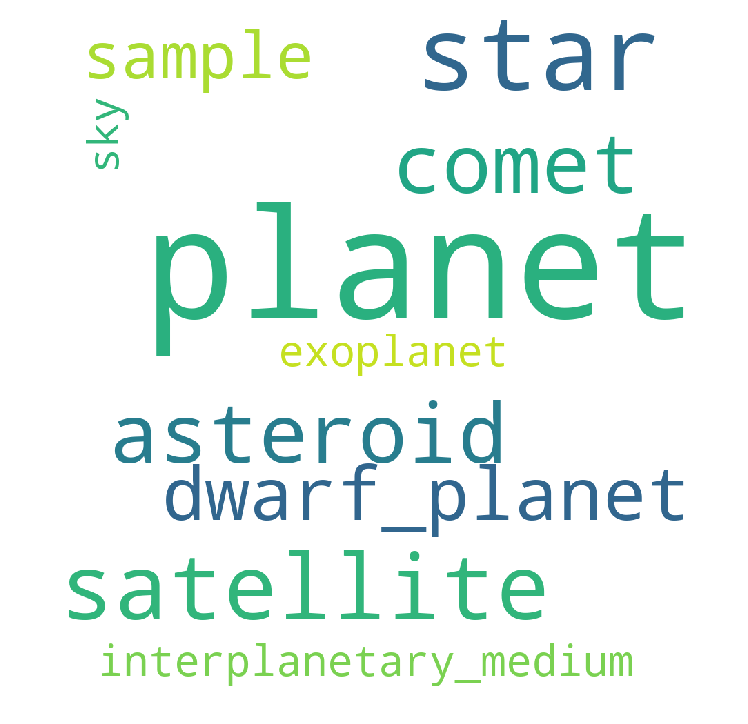

In [126]:
# plot the WordCloud image for cleaned target_class                    
plt.figure(figsize = (10, 10), facecolor = None) 
plt.imshow(wc_clean_whole_tclass) 
plt.axis("off") 
plt.tight_layout(pad = 0) 

This is the Word Cloud for cleaned target_class for whole dataset

# Deserialization of target names into separate rows


Here we deserialise the target_name from the serialised table df_agg_T into separate rows 

In [127]:
#Deserialization of target_name into separate rows 
#df_agg_T_CLASS contains deserialised target_classes
#splitDataFrameList() function helps to perform deserialization & is defined previously before deserialization of target_classes
index_name = df_agg_T_CLASS.index.name  
df_agg_T_CLASS.reset_index(inplace=True)

df_agg_T_NAME = splitDataFrameList(df_agg_T_CLASS, 'target_name', ';')
df_agg_T_NAME.set_index(index_name or 'index', inplace=True)
if not index_name:
    df_agg_T_NAME.index.name = None
df_agg_T_NAME

,target_name,target_class,measurement_type,instrument_name,instrument_host_name,dataproduct_type,s_region
hfc1ar,sun,star,"phys.polarization.circular, phys.veloc.orbital...",mdi,soho,im,0
exoplanet,hd 3167 d,exoplanet,phys.size;meta.file#phys.composition.species#p...,,,ci,0
exoplanet,epic 203868608 (ab) b,exoplanet,phys.size;meta.file#phys.composition.species#p...,,,ci,0
exoplanet,hd 217107 b,exoplanet,phys.size;meta.file#phys.composition.species#p...,,,ci,0
exoplanet,hat-p-44 c,exoplanet,phys.size;meta.file#phys.composition.species#p...,,,ci,0
exoplanet,gj 832 b,exoplanet,phys.size;meta.file#phys.composition.species#p...,,,ci,0
exoplanet,hd 215456 b,exoplanet,phys.size;meta.file#phys.composition.species#p...,,,ci,0
exoplanet,hd 7199 b,exoplanet,phys.size;meta.file#phys.composition.species#p...,,,ci,0
exoplanet,hd 168746 b,exoplanet,phys.size;meta.file#phys.composition.species#p...,,,ci,0
exoplanet,hd 109246 b,exoplanet,phys.size;meta.file#phys.composition.species#p...,,,ci,0


In [136]:
df_agg_T_NAME.shape #df_agg_T_NAME.shape is a dataframe that has de-serialised target classes and target names

(6763, 7)

# Cleaning and pre-processing target name before Word Cloud

In [153]:
# tname_df is a dataframe 
#tname_df contains the column target_name from dataframe df_agg_T_NAME which contains target_classes & target_names in deserialised format
#tname_df has names of services as index
tname_df= df_agg_T_NAME.target_name.to_frame()
tname_df

,target_name
hfc1ar,sun
exoplanet,hd 3167 d
exoplanet,epic 203868608 (ab) b
exoplanet,hd 217107 b
exoplanet,hat-p-44 c
exoplanet,gj 832 b
exoplanet,hd 215456 b
exoplanet,hd 7199 b
exoplanet,hd 168746 b
exoplanet,hd 109246 b


In [154]:
len(tname_df) #there are 6763 target_names in tname_df

6763

In [155]:
#first we remove leading '#'s from target_name 
# if they are in the middle or end, we are replacing '#' with 2 whitespaces because amdadb has earth#sun
#we are not replacing with 1 whitespace because exoplanet has hd 3167 d as target_name
tname_df['target_name']=tname_df['target_name'].str.lstrip('#')
tname_df['target_name']=tname_df['target_name'].str.replace('#', '  ')
tname_df
#amdadb has earth and sun separated by 2 whitespaces as its target_class

,target_name
hfc1ar,sun
exoplanet,hd 3167 d
exoplanet,epic 203868608 (ab) b
exoplanet,hd 217107 b
exoplanet,hat-p-44 c
exoplanet,gj 832 b
exoplanet,hd 215456 b
exoplanet,hd 7199 b
exoplanet,hd 168746 b
exoplanet,hd 109246 b


In [156]:
#stripping off leading and trailing whitespaces
tname_df['target_name']=tname_df['target_name'].str.strip()
tname_df

,target_name
hfc1ar,sun
exoplanet,hd 3167 d
exoplanet,epic 203868608 (ab) b
exoplanet,hd 217107 b
exoplanet,hat-p-44 c
exoplanet,gj 832 b
exoplanet,hd 215456 b
exoplanet,hd 7199 b
exoplanet,hd 168746 b
exoplanet,hd 109246 b


In [157]:
#for convinience and to ensure we dont mistakes during split of target_name
#we converted the index to a column named index
tname_df=tname_df.reset_index()
tname_df

,index,target_name
0,hfc1ar,sun
1,exoplanet,hd 3167 d
2,exoplanet,epic 203868608 (ab) b
3,exoplanet,hd 217107 b
4,exoplanet,hat-p-44 c
5,exoplanet,gj 832 b
6,exoplanet,hd 215456 b
7,exoplanet,hd 7199 b
8,exoplanet,hd 168746 b
9,exoplanet,hd 109246 b


In [158]:
#renaming column named index to schema
tname_df=tname_df.rename(columns={'index':'schema'})
tname_df

,schema,target_name
0,hfc1ar,sun
1,exoplanet,hd 3167 d
2,exoplanet,epic 203868608 (ab) b
3,exoplanet,hd 217107 b
4,exoplanet,hat-p-44 c
5,exoplanet,gj 832 b
6,exoplanet,hd 215456 b
7,exoplanet,hd 7199 b
8,exoplanet,hd 168746 b
9,exoplanet,hd 109246 b


In [167]:
#to resolve earth and sun into 2 separate target_names for amdadb by split using 2 whitespaces i.e.' '
import numpy as np
from itertools import chain

# return list from series of space-separated strings
def chainer(s):
    return list(chain.from_iterable(s.str.split('  ')))

# calculate lengths of splits
lens = tname_df['target_name'].str.split('  ').map(len)

# create new dataframe, repeating or chaining as appropriate
tname_df_cleaned = pandas.DataFrame({'schema': np.repeat(tname_df['schema'], lens),
                    'target_name': chainer(tname_df['target_name']) })

tname_df_cleaned #tname_df_cleaned is dataframe that splits a target_name with 2 whitespaces in between to separate target_name

,schema,target_name
0,hfc1ar,sun
1,exoplanet,hd 3167 d
2,exoplanet,epic 203868608 (ab) b
3,exoplanet,hd 217107 b
4,exoplanet,hat-p-44 c
5,exoplanet,gj 832 b
6,exoplanet,hd 215456 b
7,exoplanet,hd 7199 b
8,exoplanet,hd 168746 b
9,exoplanet,hd 109246 b


amdadb now occupies rows 4390 and has 2 target_names split into 2 different rows - earth and sun

In [168]:
#earlier we could not get rid of empty strings using isnull() so we do it now
#convert empty strings to np.nan objects
#import numpy as np
tname_df_cleaned['target_name'].replace('', np.nan, inplace=True)
tname_df_cleaned
#we can see that earlier abs_cs in 4661 had empty string as target_name but now we replaced it to NaN to dispose it easily

,schema,target_name
0,hfc1ar,sun
1,exoplanet,hd 3167 d
2,exoplanet,epic 203868608 (ab) b
3,exoplanet,hd 217107 b
4,exoplanet,hat-p-44 c
5,exoplanet,gj 832 b
6,exoplanet,hd 215456 b
7,exoplanet,hd 7199 b
8,exoplanet,hd 168746 b
9,exoplanet,hd 109246 b


In [169]:
#Now we can drop the null values i.e. NaN objects easily
#hence we drop the target_names which are empty strings
tname_df_cleaned.dropna(subset=['target_name'], inplace=True)
tname_df_cleaned
#now target_name has no empty string and we can see that  abs_cs in 4661 is removed as it had an empty string in target_name

,schema,target_name
0,hfc1ar,sun
1,exoplanet,hd 3167 d
2,exoplanet,epic 203868608 (ab) b
3,exoplanet,hd 217107 b
4,exoplanet,hat-p-44 c
5,exoplanet,gj 832 b
6,exoplanet,hd 215456 b
7,exoplanet,hd 7199 b
8,exoplanet,hd 168746 b
9,exoplanet,hd 109246 b


In [170]:
#we are removing (s and replacing with ''
tname_df_cleaned['target_name']=tname_df_cleaned['target_name'].str.replace('(','')
tname_df_cleaned

,schema,target_name
0,hfc1ar,sun
1,exoplanet,hd 3167 d
2,exoplanet,epic 203868608 ab) b
3,exoplanet,hd 217107 b
4,exoplanet,hat-p-44 c
5,exoplanet,gj 832 b
6,exoplanet,hd 215456 b
7,exoplanet,hd 7199 b
8,exoplanet,hd 168746 b
9,exoplanet,hd 109246 b


In [171]:
#we are removing )s and replacing with ''
tname_df_cleaned['target_name']=tname_df_cleaned['target_name'].str.replace(')','')
tname_df_cleaned

,schema,target_name
0,hfc1ar,sun
1,exoplanet,hd 3167 d
2,exoplanet,epic 203868608 ab b
3,exoplanet,hd 217107 b
4,exoplanet,hat-p-44 c
5,exoplanet,gj 832 b
6,exoplanet,hd 215456 b
7,exoplanet,hd 7199 b
8,exoplanet,hd 168746 b
9,exoplanet,hd 109246 b


In [174]:
#we ensure that every target_name is in lower case
tname_df_cleaned['target_name']=tname_df_cleaned['target_name'].str.lower() 
tname_df_cleaned

,schema,target_name
0,hfc1ar,sun
1,exoplanet,hd 3167 d
2,exoplanet,epic 203868608 ab b
3,exoplanet,hd 217107 b
4,exoplanet,hat-p-44 c
5,exoplanet,gj 832 b
6,exoplanet,hd 215456 b
7,exoplanet,hd 7199 b
8,exoplanet,hd 168746 b
9,exoplanet,hd 109246 b


# WordCloud for Cleaned target name column of entire dataset

In [175]:
from collections import Counter
counter_tname_whole_clean = Counter()
for word in tname_df_cleaned['target_name']:
    counter_tname_whole_clean[word] += 1

In [176]:
counter_tname_whole_clean

Counter({'sun': 12,
         'hd 3167 d': 1,
         'epic 203868608 ab b': 1,
         'hd 217107 b': 1,
         'hat-p-44 c': 1,
         'gj 832 b': 1,
         'hd 215456 b': 1,
         'hd 7199 b': 1,
         'hd 168746 b': 1,
         'hd 109246 b': 1,
         'hd 111591 b': 1,
         'corot-26 b': 1,
         'hd 104985 b': 1,
         'gj 758 b': 1,
         'hd 163607 b': 1,
         'hats-31 b': 1,
         'hat-p-57 b': 1,
         'hd 218566 b': 1,
         'hd 176986 c': 1,
         'epic 203826436 b': 1,
         'gj 667 c b': 1,
         'hd 16141 b': 1,
         'epic 220194974 b': 1,
         'hd 120084 b': 1,
         'hats-51 b': 1,
         'gj 667 c g': 1,
         'hd 219134 d': 1,
         'hat-p-29 b': 1,
         'hd 82886 b': 1,
         'hd 202432 b': 1,
         '2mass j11193254 ab': 1,
         '55 cnc b': 1,
         'hd 158038 b': 1,
         'hd 125390 b': 1,
         'hd 238914 b': 1,
         '24 sex c': 1,
         '2mass j2250+2325 b': 1,
    

In [177]:
wc_clean_whole_tname = WordCloud(width = 1000, height = 1000, 
                background_color ='white', 
                min_font_size = 10).fit_words(counter_tname_whole_clean)

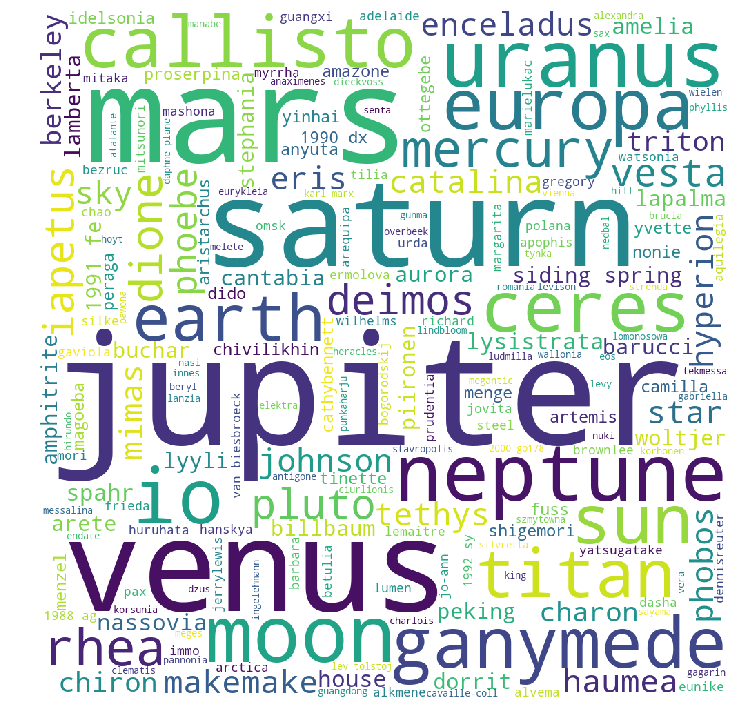

In [178]:
# plot the WordCloud image for cleaned target_name for entire dataset                      
plt.figure(figsize = (10, 10), facecolor = None) 
plt.imshow(wc_clean_whole_tname) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

This is the Word Cloud for cleaned target_name for entire dataset